In [1]:
from boututils.datafile import DataFile
from boutdata.collect import collect
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os, sys, pathlib
import platform
import traceback
import xarray as xr
import xbout
from pathlib import Path
import xhermes as xh
import matplotlib.pyplot as plt
import os, sys, pathlib
import numpy as np
import xarray as xr
import xhermes as xh

sys.path.append(os.path.join(r"/users/jlb647/scratch/simulation_program/hermes-3_sim/analysis/sdtools"))
sys.path.append(os.path.join(r"/users/jlb647/scratch/simulation_program/hermes-3_sim/analysis/my_notebooks/notebooks/hermes-3/general_functions"))
sys.path.append(os.path.join(r'/users/jlb647/scratch/simulation_program/hermes-3_sim/analysis/my_notebooks/notebooks/hermes-3/general_functions/source_functions.py'))

from convergence_functions import *
from plotting_functions import *
from source_functions import *

from matplotlib.ticker import LogFormatter

sys.path.append(os.path.join(r"/users/jlb647/scratch/simulation_program/hermes-3_sim/analysis/sdtools"))
sys.path.append(os.path.join(r"/users/jlb647/scratch/simulation_program/hermes-3_sim/analysis/my_notebooks/notebooks/hermes-3/transients"))
sys.path.append(os.path.join(r"/users/jlb647/scratch/simulation_program/hermes-3_sim/analysis/my_notebooks/notebooks/hermes-3/general_functions"))


from plotting_functions import *
from convergence_functions import * 

from hermes3.case_db import *
from hermes3.load import *
from hermes3.named_selections import *
from hermes3.plotting import *
from hermes3.grid_fields import *
from hermes3.accessors import *
from hermes3.utils import *
from hermes3.fluxes import *


# plt.style.use('ggplot')
plt.rcParams.update({'font.size': 10})
linewidth = 3
markersize = 15



# plt.style.use('ggplot')
plt.style.use('default')
plt.rcParams["axes.edgecolor"] = "black"
plt.rcParams["axes.linewidth"] = 1
plt.rcParams['xtick.labelsize'] = 18
plt.rcParams['ytick.labelsize'] = 18
plt.rcParams['axes.grid'] = True
plt.rcParams.update({'font.size': 16})



%load_ext autoreload
%autoreload 2




# slow pump/source 4x power pulse transient

In [3]:
slow_pump = xh.open('/users/jlb647/scratch/simulation_program/hermes-3_sim/simulation_dir/2024-11_week_9/steady_state_density_source/slow_pump_0.1/case_01_transient_test')
old_case = xh.open('/users/jlb647/scratch/simulation_program/hermes-3_sim/simulation_dir/2024-10_glimmer_pump_test/reservior_test/base_case')
sending_it = xh.open('/users/jlb647/scratch/simulation_program/hermes-3_sim/simulation_dir/2024-11_week_9/transient_pulses/case_02_sending_it_even_longer')

array([<Axes: xlabel='S$_\\parallel$ (m)', ylabel='Te (eV)'>,
       <Axes: xlabel='S$_\\parallel$ (m)', ylabel='Td (eV)'>,
       <Axes: xlabel='S$_\\parallel$ (m)', ylabel='Ne (m^-3)'>,
       <Axes: xlabel='S$_\\parallel$ (m)', ylabel='Nd (m^-3)'>],
      dtype=object)

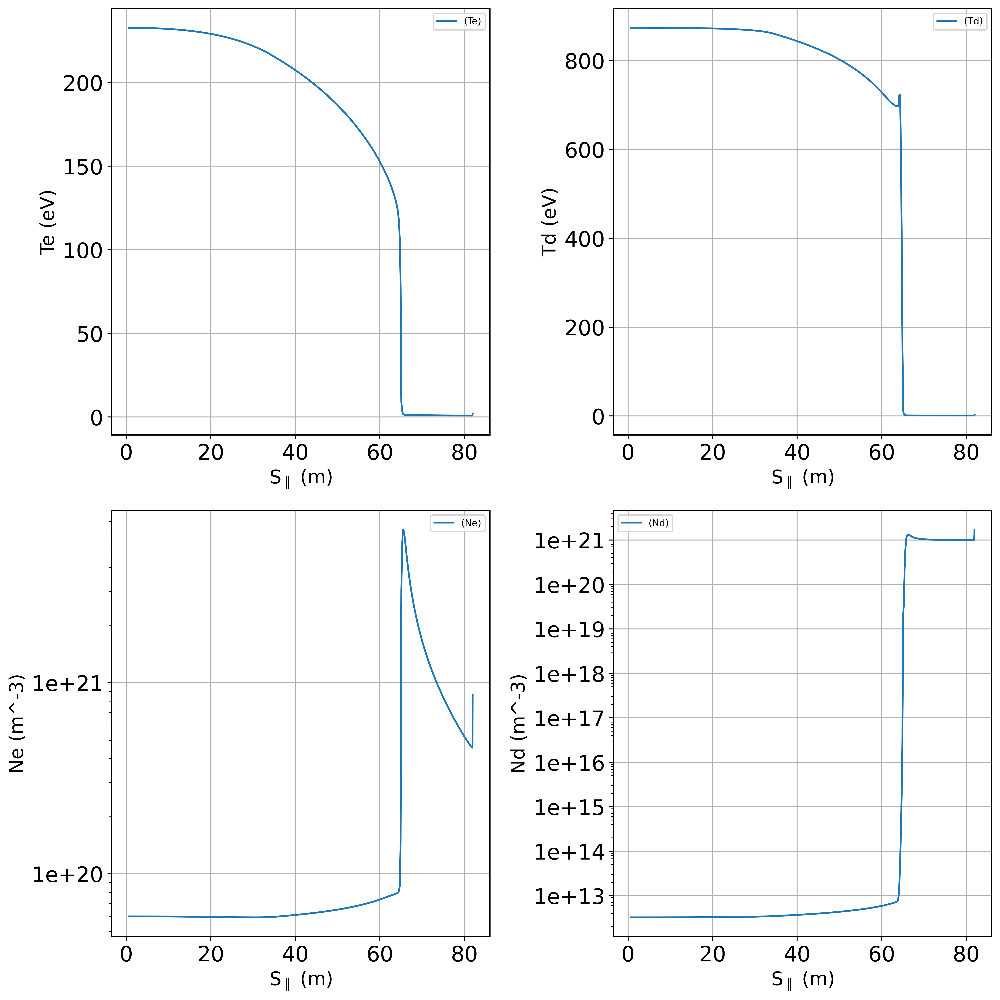

In [23]:
plot_profiles(slow_pump, ['Te', 'Td', 'Ne', 'Nd'])

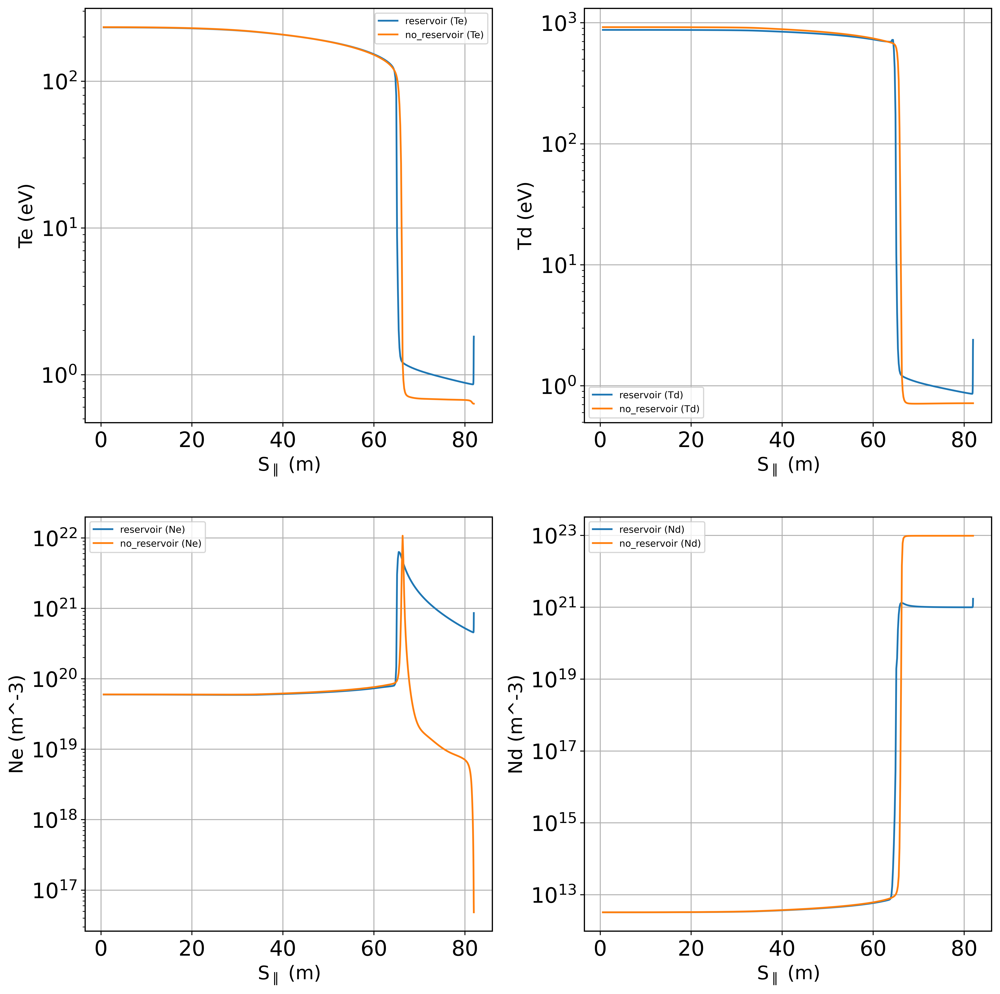

In [24]:
data_set = {'reservoir': slow_pump, 'no_reservoir': old_case}
ax = compare_profiles(data_set, ['Te', 'Td', 'Ne', 'Nd'])
for ax in ax:
    ax.set_yscale('log')

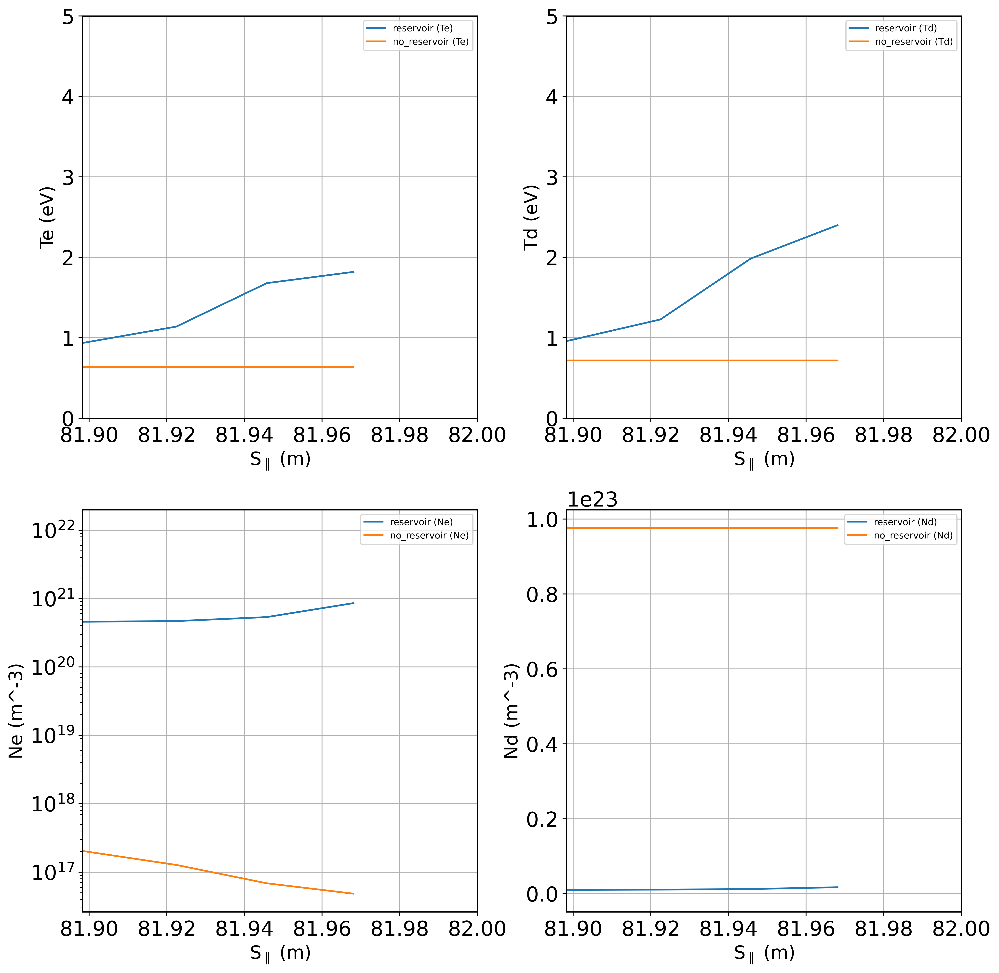

In [25]:
y = slow_pump['y'].values
data_set = {'reservoir': slow_pump, 'no_reservoir': old_case}
ax = compare_profiles(data_set, ['Te', 'Td', 'Ne', 'Nd'])

for ax1 in ax[2:3]:
    ax1.set_yscale('log')

for axes in ax[0:2]:
    axes.set_xbound(y[-5], 82)
    axes.set_ybound(0,5)

for ax2 in ax:
    ax2.set_xbound(y[-5], 82)

In [2]:
def plot_profiles_animation(simulation_data, variables=['Te'], data_label=None,
                            guard_replace=True, linestyles=None, log_threshold=1e6, filename='profiles_animation.gif',
                            time_slices=(-40, None), step=1, detachment_front=False):
    """
    Creates an animated GIF of the specified variable profiles for a user-specified range of time slices,
    with time plotted in milliseconds. Optionally, plot the detachment front location.

    Parameters:
    simulation_data (xarray Dataset): Dataset for the simulation.
    variables (list): List of variables to plot (e.g., ['Te', 'Ti']).
    data_label (str, optional): Label for the dataset in the plot legend.
    guard_replace (bool): Whether to replace guard cells.
    linestyles (list, optional): Custom linestyles for each variable plot.
    log_threshold (float): Threshold above which the y-axis will be plotted in log scale.
    filename (str): The filename to save the animation as a GIF.
    time_slices (tuple): A tuple specifying the range of time slices to use for the animation (start_slice, end_slice).
                         Defaults to the last 40 time slices.
    step (int): Step interval for sampling time slices to reduce the number of frames.
    detachment_front (bool): If True, plot the detachment front as a horizontal dashed red line.
    """
    # Unpack the start and end of the time slice range
    start_slice, end_slice = time_slices

    # Select the time slices from the dataset with the specified step interval
    selected_steps = simulation_data.isel(t=slice(start_slice, end_slice, step))
    num_timesteps = selected_steps.sizes['t']  # Calculate the number of timesteps in the sampled range
    num_vars = len(variables)

    # Get time values in seconds and convert to milliseconds
    times = selected_steps['t'].values  # Corresponding time values
    # t_conversion = simulation_data['t'].attrs.get('conversion', 1.0)
    times = times * 1e3  # Convert to milliseconds

    # Set up plot layout with two columns, adjusting rows based on the number of variables
    ncols = 2 if num_vars > 1 else 1
    nrows = (num_vars + 1) // 2  # Ensure enough rows

    fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(12, 6 * nrows), dpi=500)
    
    # If we have only one subplot, axs won't be a list, so we ensure it's treated as such
    if num_vars == 1:
        axs = [axs]

    # Flatten axs in case of multiple rows and columns, to handle indexing uniformly
    axs = np.ravel(axs)

    if linestyles is None:
        linestyles = ['-'] * num_vars  # Default linestyle if not provided

    # Precompute y-axis limits
    y_min = {}
    y_max = {}
    for var in variables:
        data_var = selected_steps[var]
        if guard_replace:
            data_var = data_var.isel(y=slice(1, -1))  # Exclude guard cells if needed
        y_min[var] = data_var.min().values
        y_max[var] = data_var.max().values

    # Calculate initial detachment front position for static purple line
    initial_detachment_front = None
    detachment_front_max = None

    if detachment_front:
        # Determine the initial detachment front for the static purple line
        initial_detachment_front = detachment_front_finder(selected_steps.isel(t=0))

        # Calculate the maximum detachment front position over all time steps
        detachment_front_max = max(
            detachment_front_finder(selected_steps.isel(t=t_index)) or 0
            for t_index in range(num_timesteps)
        )

    def update_plot(t_index):
        """Updates the plot for the given time index."""
        current_data = selected_steps.isel(t=t_index)  # Select the time step within the sampled range
        current_time_ms = times[t_index]  # Get the corresponding time in milliseconds

        for i, var in enumerate(variables):
            ax = axs[i]
            ax.clear()  # Clear the previous frame

            y = current_data['y'].values
            var_data = np.ravel(current_data[var].values)

            if guard_replace:
                y = y[1:-1]
                var_data = replace_guards(var_data)

            label = f'{data_label} ({var})'
            ax.plot(y, var_data, label=label, linestyle=linestyles[i])

            # Determine if log scale is needed based on threshold
            if np.max(np.abs(var_data)) > log_threshold:
                scale = "log"
            else:
                scale = "linear"

            # Set the appropriate scale
            ax.set_yscale(scale)
            if scale == "log":
                ax.yaxis.set_major_formatter(log_formatter())  # Apply log formatting

            # Get units
            units = current_data[var].attrs.get('units', 'Unknown units')

            ax.set_xlabel(r'S$_\parallel$ (m)')
            ax.set_ylabel(f'{var} ({units})')
            ax.legend(loc='best', fontsize=8)
            ax.grid(True)
            ax.set_title(f'Time: {current_time_ms:.2f} ms')

            ax.set_ylim(y_min[var], y_max[var])  # Set fixed y-axis limits

            # Set xlim based on maximum detachment front position with a 10% buffer
            if detachment_front and detachment_front_max is not None:
                buffer = detachment_front_max * 0.1
                ax.set_xlim(max(y) - detachment_front_max - buffer, max(y))

                # Plot the static initial detachment front as a purple line
                if initial_detachment_front is not None:
                    ax.axvline(initial_detachment_front, color='purple', linestyle='-', label="Initial Detachment Front")

                # Plot dynamic detachment front as a red dashed line for each frame
                front_loc = detachment_front_finder(current_data)
                if front_loc is not None:
                    ax.axvline(front_loc, color='red', linestyle='--', label=f"Detachment Front: {front_loc:.2f} m")

    # Create animation using FuncAnimation
    ani = animation.FuncAnimation(fig, update_plot, frames=num_timesteps, repeat=False)

    # Save the animation as a GIF using PillowWriter
    ani.save(filename, writer='pillow', fps=10)

    print(f"Animation saved as {filename}")
    plt.close()

In [3]:
corrected_pump = xh.open('/users/jlb647/scratch/simulation_program/hermes-3_sim/simulation_dir/2024-11_week_10/area_refactor/base_00xxx_corrected_area')

In [27]:
plot_profiles_animation(corrected_pump, ['Te', 'Td+', 'Ne', 'Nd'], time_slices = (-100, None),step = 1)

Animation saved as profiles_animation.gif


In [28]:
convert_gif_to_mp4('profiles_animation.gif', 'transient_reservoir.mp4')

Moviepy - Building video transient_reservoir.mp4.
Moviepy - Writing video transient_reservoir.mp4



Moviepy - Done !
Moviepy - video ready transient_reservoir.mp4


In [29]:
super_slow_pump = xh.open('/users/jlb647/scratch/simulation_program/hermes-3_sim/simulation_dir/2024-11_week_10/area_refactor/base_00xxx_corrected_area')

In [ ]:
plot_profiles_animation(super_slow_pump, ['Te', 'Td+', 'Ne', 'Nd'], time_slices = (-100, None),step = 1)

# Source shapes

In [75]:
ds = xh.open('/users/jlb647/scratch/simulation_program/hermes-3_sim/simulation_dir/2024-11_week_9/steady_state_density_source/alter_pump_location/case_01_get_PI')

In [78]:
y = ds['y'].values[1:-1]
recycle = ds['Sd_target_recycle'].squeeze().values[1:-1]
print(recycle)

[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 9.78213293e+26]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 9.77966583e+26]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 9.77657329e+26]
 ...
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 1.00042293e+27]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 1.00042462e+27]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 1.00042416e+27]]


steady state pi source = 3.0886725680216515e+22


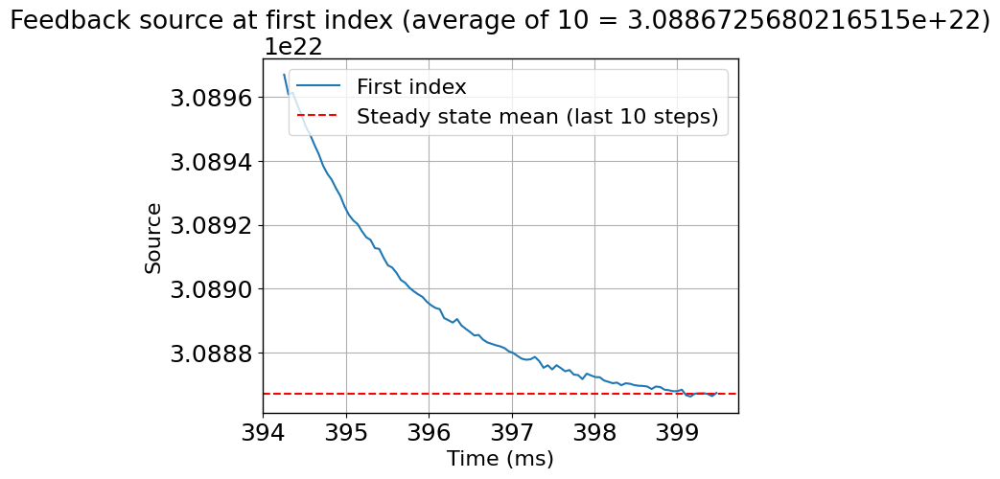

In [4]:
pi_feedback_source(ds, plot = True)

<xarray.DataArray (t: 101, x: 1)>
dask.array<sum-aggregate, shape=(101, 1), dtype=float64, chunksize=(101, 1), chunktype=numpy.ndarray>
Coordinates:
  * t        (t) float64 0.3779 0.3779 0.378 0.378 ... 0.3829 0.383 0.383 0.3831
  * x        (x) int64 0
    z        float64 3.142
Attributes:
    current_time_index:  101
    cell_location:       CELL_CENTRE
    conversion:          1e+19
    direction_y:         Standard
    direction_z:         Standard
    long_name:           e number density
    source:              quasineutral
    species:             e
    standard_name:       density
    time_dimension:      t
    units:               m^-3
    metadata:            {'BOUT_VERSION': 5.2, 'Bnorm': 1.0, 'Cs0': 97871.514...
    options:             IncIntShear = false\t\t# type: bool, source: default...
    geometry:            
    units_type:          SI

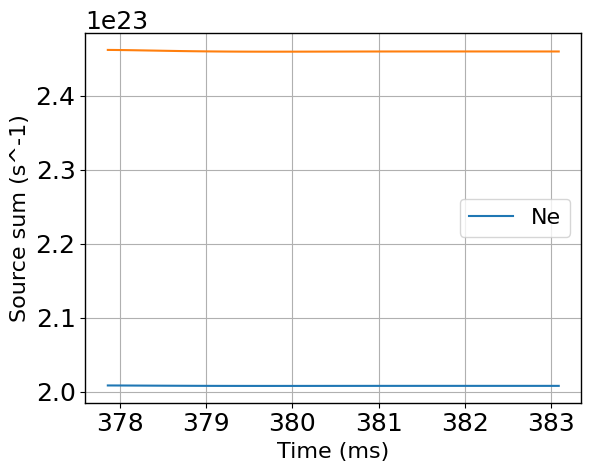

In [11]:
# def sum_source(ds, parameter = 'Te', plot = False):
#     t = ds['t'].values*1e3
#     # Squeeze out singleton dimensions
#     source = ds[parameter].squeeze()

#     # Compute the volume element (assuming dx, dy, dz, and J are consistent across the y dimension)
#     volume_element = ds["dx"] * ds["dy"] * ds["dz"] * ds["J"]

#     # Multiply by the volume element and sum across the y dimension for each time step
#     time_sum = (source * volume_element).sum(dim="y")

#     if plot:
#         plt.plot(t, time_sum.values)
#         plt.xlabel('Time (ms)')
#         plt.ylabel('Source sum (s^-1)')
#         plt.legend([parameter])
#         # plt.yscale('log')
#     return time_sum

# # # Squeeze out singleton dimensions
# # source = ds["Te"].squeeze()

# # # Compute the volume element (assuming dx, dy, dz, and J are consistent across the y dimension)
# # volume_element = ds["dx"] * ds["dy"] * ds["dz"] * ds["J"]

# # # Multiply by the volume element and sum across the y dimension for each time step
# # time_sum = (source * volume_element).sum(dim="y")

# # plt.plot(ds["t"]*1e3, time_sum.values)

# ds['Sd+_rec']
# ds['Sd+_iz']

# # sum_source(ds, parameter = 'Sd_rsv_div_sol', plot = True)
# # sum_source(ds, parameter = 'Sd+_iz', plot = True)
# # sum_source(ds, parameter = 'Sd+_rec', plot = True)
# # sum_source(ds, parameter = 'SNd+', plot = True)
# sum_source(ds, parameter = 'Nd', plot = True)
# sum_source(ds, parameter = 'Ne', plot = True)

In [110]:
import matplotlib.pyplot as plt
import numpy as np

def sum_source(ds, sources=["Te"], sinks=[], plot=False, log_scale=False):
    """
    Sum specified sources and sinks across the spatial domain over time to check 
    for particle balance in steady state, and compute the net total source.

    Parameters:
        ds (xarray.Dataset): The dataset containing simulation data.
        sources (list of str): List of parameter names to sum as sources (positive).
        sinks (list of str): List of parameter names to sum as sinks (negative).
        plot (bool): Whether to plot the results. Default is False.
        log_scale (bool): Whether to use a logarithmic y-scale for the plot.
                          Default is False.
    
    Returns:
        dict: Contains the time-summed values for each source, sink, and the total net source.
    """
    
    # Convert time to milliseconds
    t = ds["t"].values * 1e3
    
    # Compute the volume element (assuming dx, dy, dz, and J are consistent across y)
    volume_element = ds["dx"] * ds["dy"] * ds["dz"] * ds["J"]
    
    # Dictionary to store results for each parameter and the total
    results = {}
    total_source = 0  # Initialize total source to accumulate contributions
    
    # Process sources (positive terms)
    for source_param in sources:
        if source_param not in ds:
            raise ValueError(f"Source parameter '{source_param}' not found in the dataset.")
        
        # Squeeze out singleton dimensions and compute volume-weighted sum
        source = np.abs(ds[source_param].squeeze())
        time_sum = (source * volume_element).sum(dim="y")
        
        # Accumulate into total source as positive
        total_source += time_sum
        
        # Store individual source results
        results[source_param] = time_sum
    
    # Process sinks
    for sink_param in sinks:
        if sink_param not in ds:
            raise ValueError(f"Sink parameter '{sink_param}' not found in the dataset.")
        
        # Squeeze out singleton dimensions and compute volume-weighted sum
        sink = ds[sink_param].squeeze()
        time_sum = (sink * volume_element).sum(dim="y")
        
        if log_scale:
            # Take the absolute value for logging but subtract from total
            abs_time_sum = np.abs(time_sum)
            total_source -= abs_time_sum
            results[sink_param] = abs_time_sum  # Store as positive for plotting
        else:
            # Use negative value for sinks and add to total
            negative_time_sum = -np.abs(time_sum)
            total_source += negative_time_sum  # Accumulate as negative
            results[sink_param] = negative_time_sum  # Store as negative for plotting

    # Store the total source/sink in the results
    results['Total Source'] = total_source

    # Plot if requested
    if plot:
        plt.figure(figsize=(10, 6))
        
        for parameter, time_sum in results.items():
            if parameter in sources:
                plt.plot(t, time_sum.values, label=f'{parameter} (source)')
            elif parameter in sinks:
                plt.plot(t, time_sum.values, label=f'{parameter} (sink)', linestyle='--')
        
        plt.plot(t, total_source.values, label='Total Source', color='black', linestyle=':')
        
        if log_scale:
            plt.yscale('log')
        
        plt.xlabel("Time (ms)")
        plt.ylabel("Source/Sink Sum (s^-1)")
        plt.legend()
        plt.show()
    
    return results


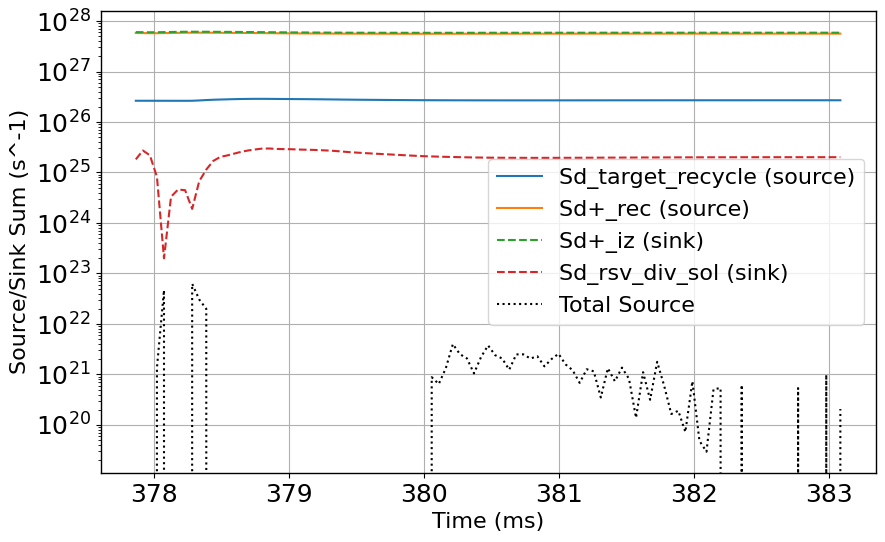

{'Sd_target_recycle': <xarray.DataArray (t: 101, x: 1)>
 dask.array<sum-aggregate, shape=(101, 1), dtype=float64, chunksize=(101, 1), chunktype=numpy.ndarray>
 Coordinates:
   * t        (t) float64 0.3779 0.3779 0.378 0.378 ... 0.3829 0.383 0.383 0.3831
   * x        (x) int64 0
     z        float64 3.142
 Attributes:
     current_time_index:  101
     cell_location:       CELL_CENTRE
     conversion:          9.578833303066081e+26
     direction_y:         Standard
     direction_z:         Standard
     long_name:           Target recycling particle source of d
     source:              recycling
     standard_name:       particle source
     time_dimension:      t
     units:               m^-3 s^-1
     metadata:            {'BOUT_VERSION': 5.2, 'Bnorm': 1.0, 'Cs0': 97871.514...
     options:             IncIntShear = false\t\t# type: bool, source: default...
     geometry:            
     units_type:          SI,
 'Sd+_rec': <xarray.DataArray (t: 101, x: 1)>
 dask.array<sum-agg

In [127]:
# Positive is neutral source, negative is sink (i.e ion source and pump)
source_terms = ['Sd_target_recycle', 'Sd+_rec']
sink_terms = ['Sd+_iz','Sd_rsv_div_sol']


sum_source(ds, sources=source_terms, sinks = sink_terms, plot=True, log_scale=True)

# pump_action = ds['Sd_rsv_div_sol'].isel(t=-1).values.squeeze()


# terms = ['Sd_target_recycle', 'Sd+_rec', 'Sd+_iz','Sd_rsv_div_sol']

# y = ds['y'].values
# total = np.zeros_like(ds['Sd_target_recycle'].isel(t=-1).values.squeeze())
# for i in terms:
#     plt.plot(y, ds[i].isel(t=-1).values.squeeze(), label = f'{i}')
# plt.legend()
# # plt.plot(y, pump_action)

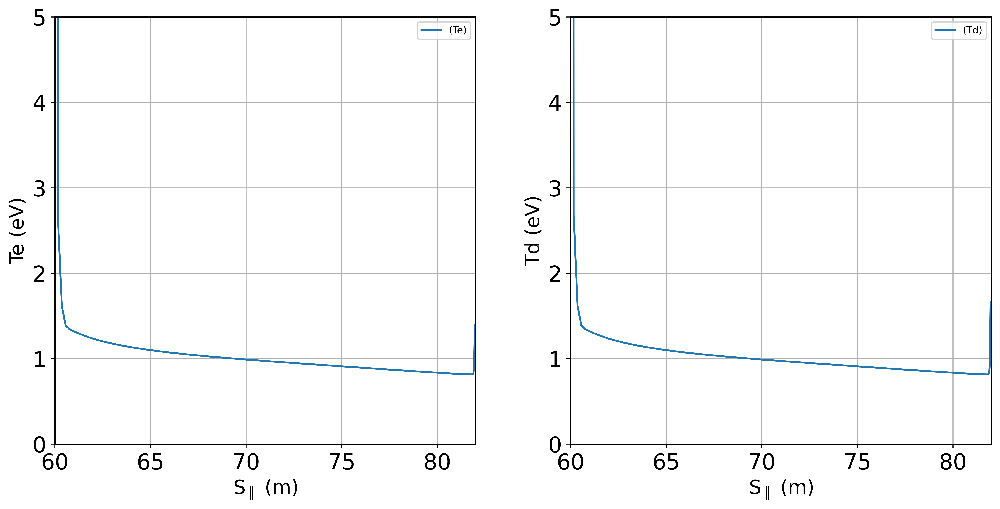

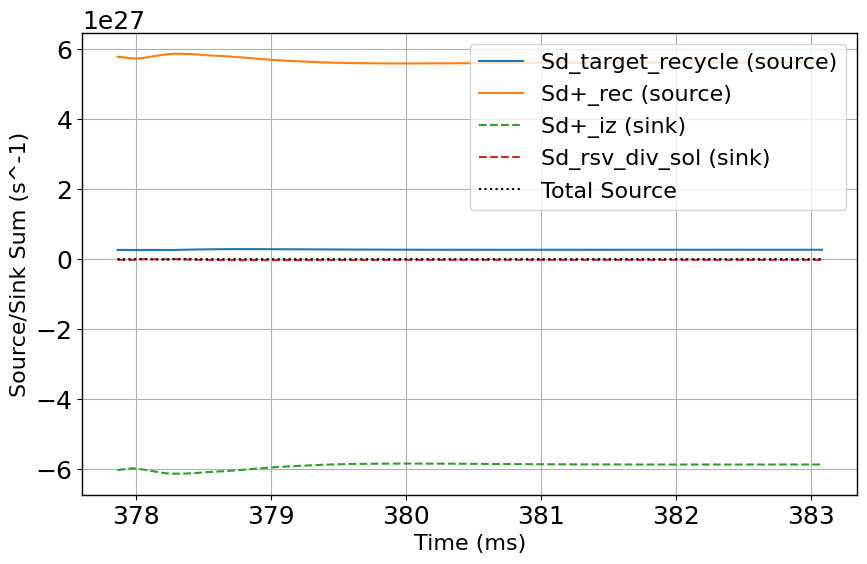

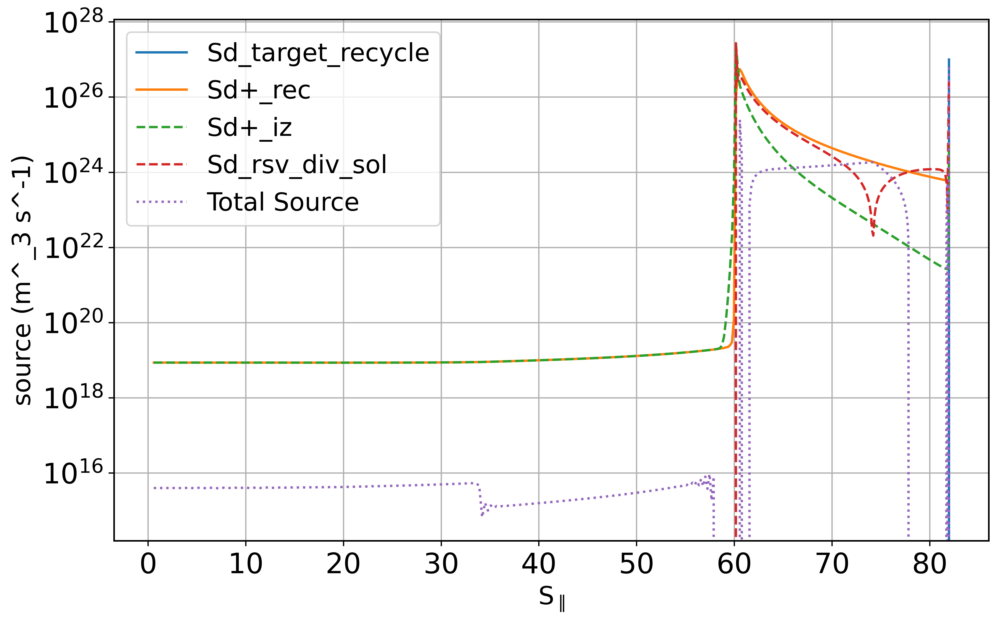

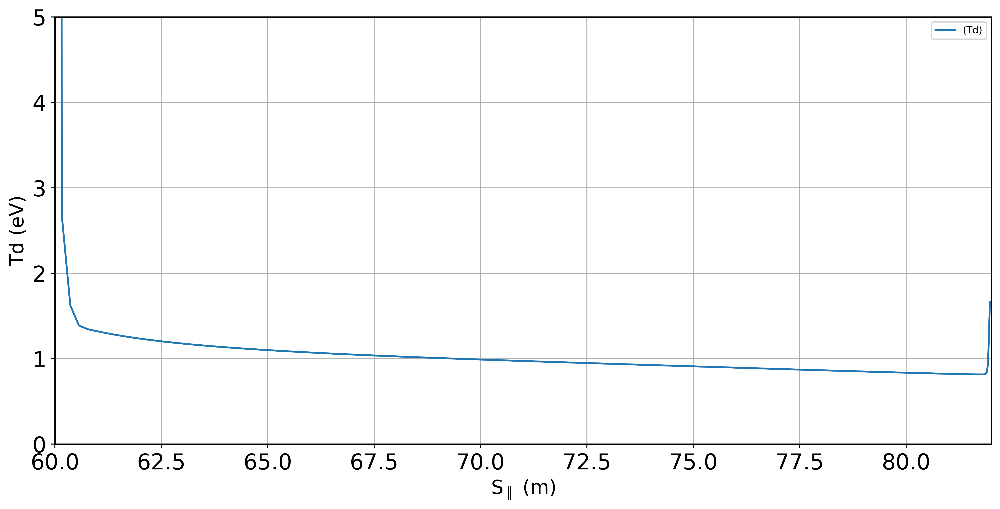

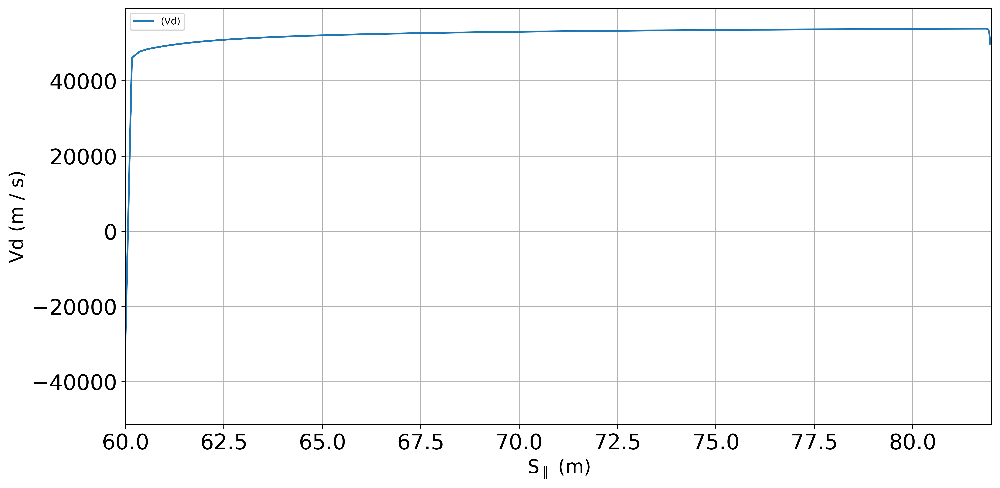

In [133]:



def spatial_sources(ds, source_terms, sink_terms, log_scale = False):
    y = ds['y'].values[1:-1]
    total = np.zeros_like(ds['Sd_target_recycle'].isel(t=-1).values.squeeze()[1:-1])
    fig, ax = plt.subplots(figsize=(10, 6), dpi = 500)
    if source_terms != ['']:
        for i in source_terms:
            if i == 'Sd_target_recycle':
                data = np.abs(ds[i].isel(t=-1).values.squeeze())[2:]
            else:    
                data = np.abs(replace_guards(ds[i].isel(t=-1).values.squeeze()))
            ax.plot(y, data, label = f'{i}')
            total += data

    if sink_terms != ['']:
        for i in sink_terms:
            if i == 'Sd_target_recycle':
                data = np.abs(ds[i].isel(t=-1).values.squeeze())[2:]
                print(data)
            else:
                data = np.abs(replace_guards(ds[i].isel(t=-1).values.squeeze())) * -1
            total += data
            if log_scale:
                data = np.abs(data)
            ax.plot(y, data, label = f'{i}', linestyle = '--')
    ax.plot(y, total, label = 'Total Source', linestyle = ':')
    if log_scale:
        ax.set_yscale('log')
        # ax.set_ybound(1e1, 1e28)
    ax.set_xlabel(r'S$_\parallel$')
    ax.set_ylabel('source (m^_3 s^-1)')
    ax.legend()

    return ax
    
source_terms = ['Sd_target_recycle', 'Sd+_rec']
sink_terms = ['Sd+_iz','Sd_rsv_div_sol']

# spatial_sources(ds, source_terms = source_terms, sink_terms = sink_terms, log_scale= True)
sum_source(ds, sources=source_terms, sinks = sink_terms, plot=True, log_scale=False)

spatial_sources(ds, source_terms = source_terms, sink_terms = sink_terms, log_scale= True)

Te_ax = plot_profiles(ds, variables = [ 'Td'])
Ne_ax = plot_profiles(ds, variables = [ 'Vd'])
for ax in Te_ax:
    ax.set_ybound(0,5)
    ax.set_xbound(60, 82)

for ax in Ne_ax:
    ax.set_xbound(60,82)
    ax.set_yscale('linear')
plt.show()


## No reservoir

In [43]:
old_case = xh.open('/users/jlb647/scratch/simulation_program/hermes-3_sim/simulation_dir/2024-10_glimmer_pump_test/reservior_test/base_case')

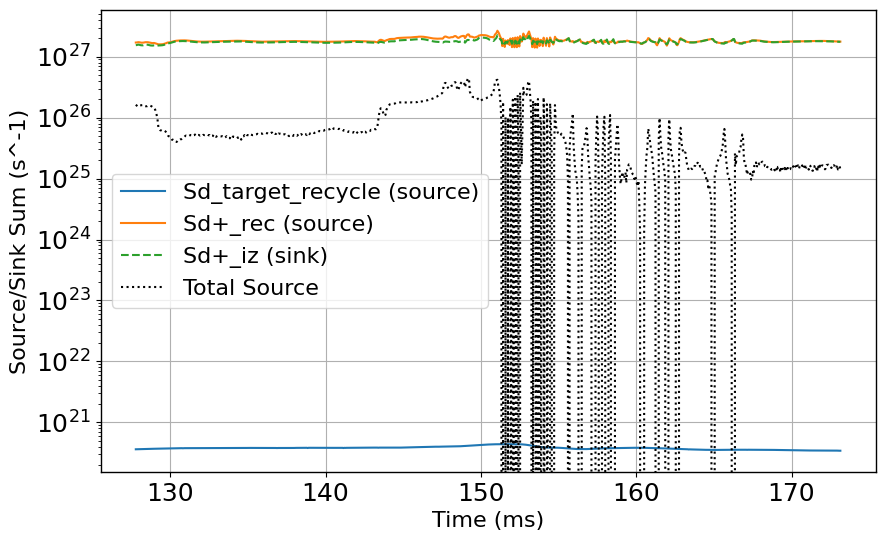

<Axes: xlabel='S$_\\parallel$', ylabel='source (m^_3 s^-1)'>

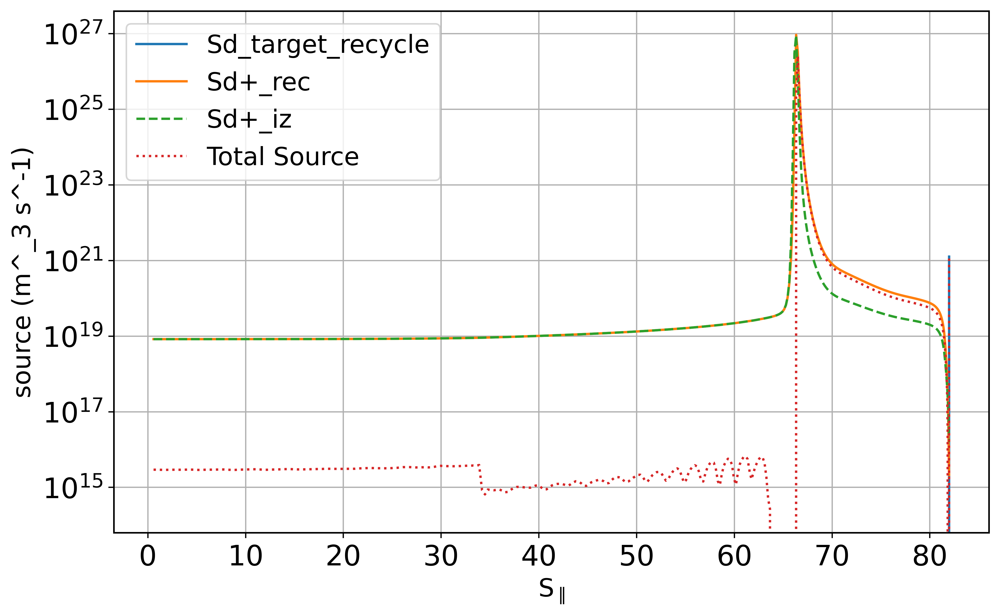

In [112]:
source_terms = ['Sd_target_recycle', 'Sd+_rec']
sink_terms = ['Sd+_iz']

sum_source(old_case, sources=source_terms, sinks = sink_terms, plot=True, log_scale=True)

spatial_sources(old_case, source_terms = source_terms, sink_terms = sink_terms, log_scale= True)

## Transient reservoir

In [48]:
transient = xh.open('/users/jlb647/scratch/simulation_program/hermes-3_sim/simulation_dir/2024-11_week_9/steady_state_density_source/slow_pump_0.1/case_01_transient_test')

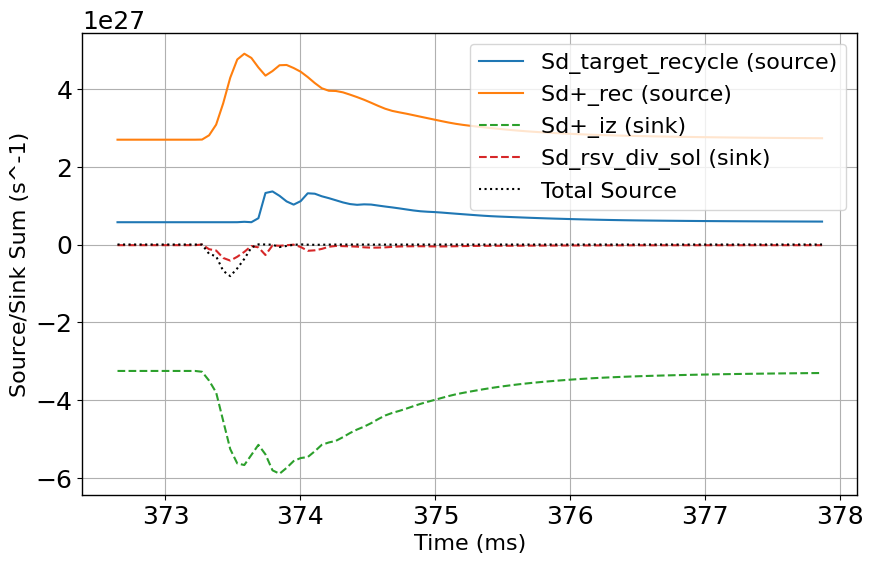

<Axes: xlabel='S$_\\parallel$', ylabel='source (m^_3 s^-1)'>

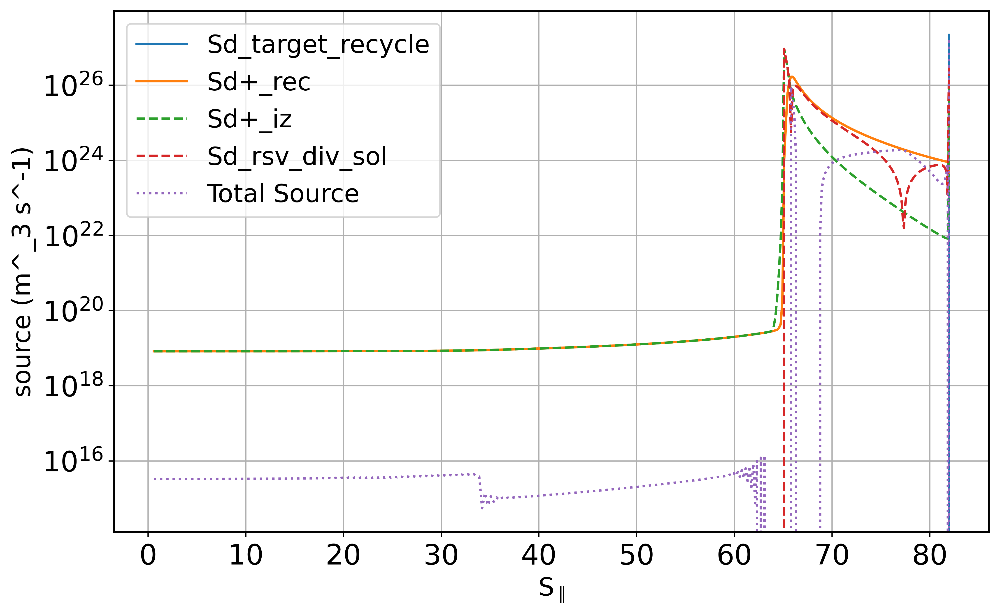

In [114]:
source_terms = ['Sd_target_recycle', 'Sd+_rec']
sink_terms = ['Sd+_iz','Sd_rsv_div_sol']

sum_source(transient, sources=source_terms, sinks = sink_terms, plot=True, log_scale=False)

spatial_sources(transient, source_terms = source_terms, sink_terms = sink_terms, log_scale= True)

## Pump only

In [54]:
pump_only = xh.open('/users/jlb647/scratch/simulation_program/hermes-3_sim/simulation_dir/2024-10_glimmer_pump_test/reservior_test/case_012_9e22_pump')

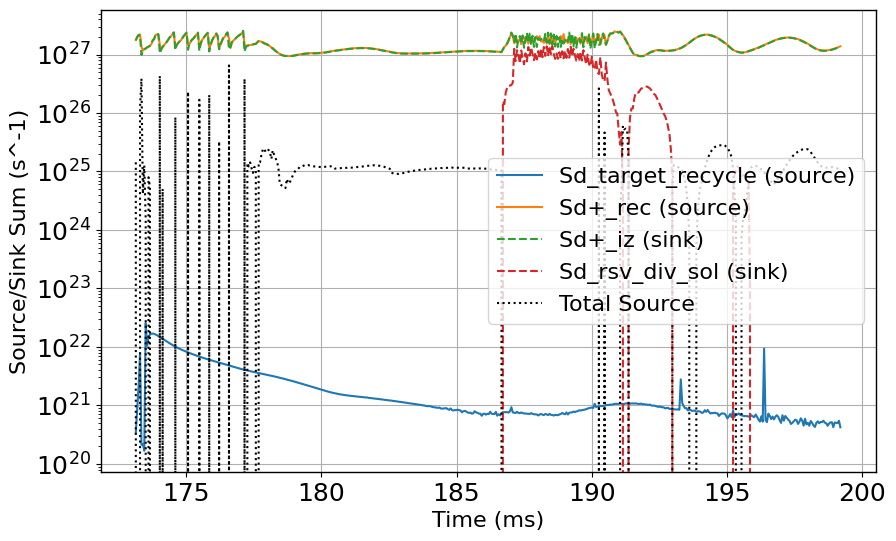

<Axes: xlabel='S$_\\parallel$', ylabel='source (m^_3 s^-1)'>

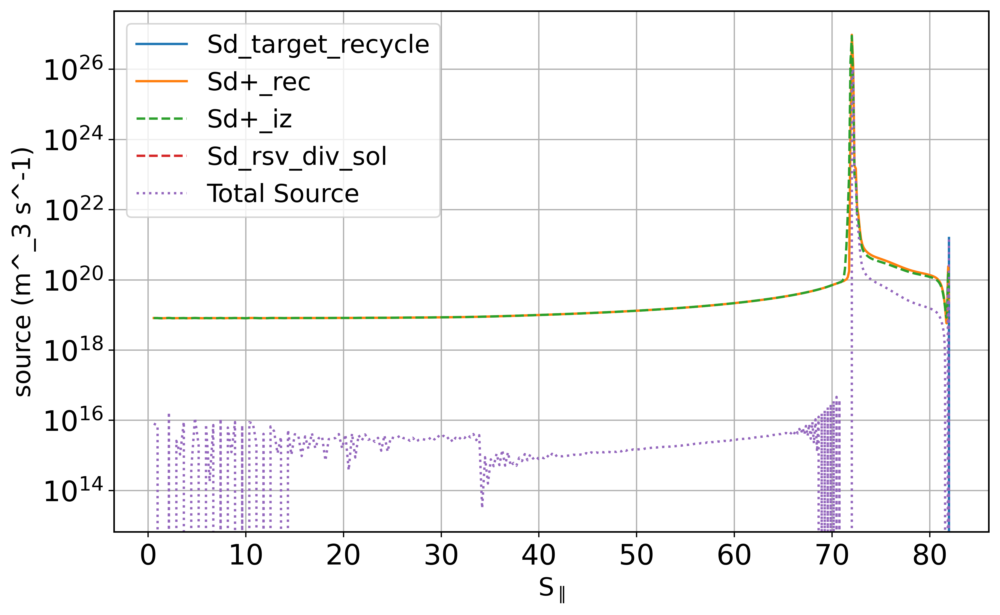

In [115]:
source_terms = ['Sd_target_recycle', 'Sd+_rec']
sink_terms = ['Sd+_iz','Sd_rsv_div_sol']

sum_source(pump_only, sources=source_terms, sinks = sink_terms, plot=True, log_scale=True)

spatial_sources(pump_only, source_terms = source_terms, sink_terms = sink_terms, log_scale= True)

## 7e20 - 0.01

In [35]:
low_pressure = xh.open('/users/jlb647/scratch/simulation_program/hermes-3_sim/simulation_dir/2024-11_week_9/steady_state_density_source/reduce_density_1e20/case_01_7e20')
old_case = xh.open('/users/jlb647/scratch/simulation_program/hermes-3_sim/simulation_dir/2024-10_glimmer_pump_test/reservior_test/base_case')

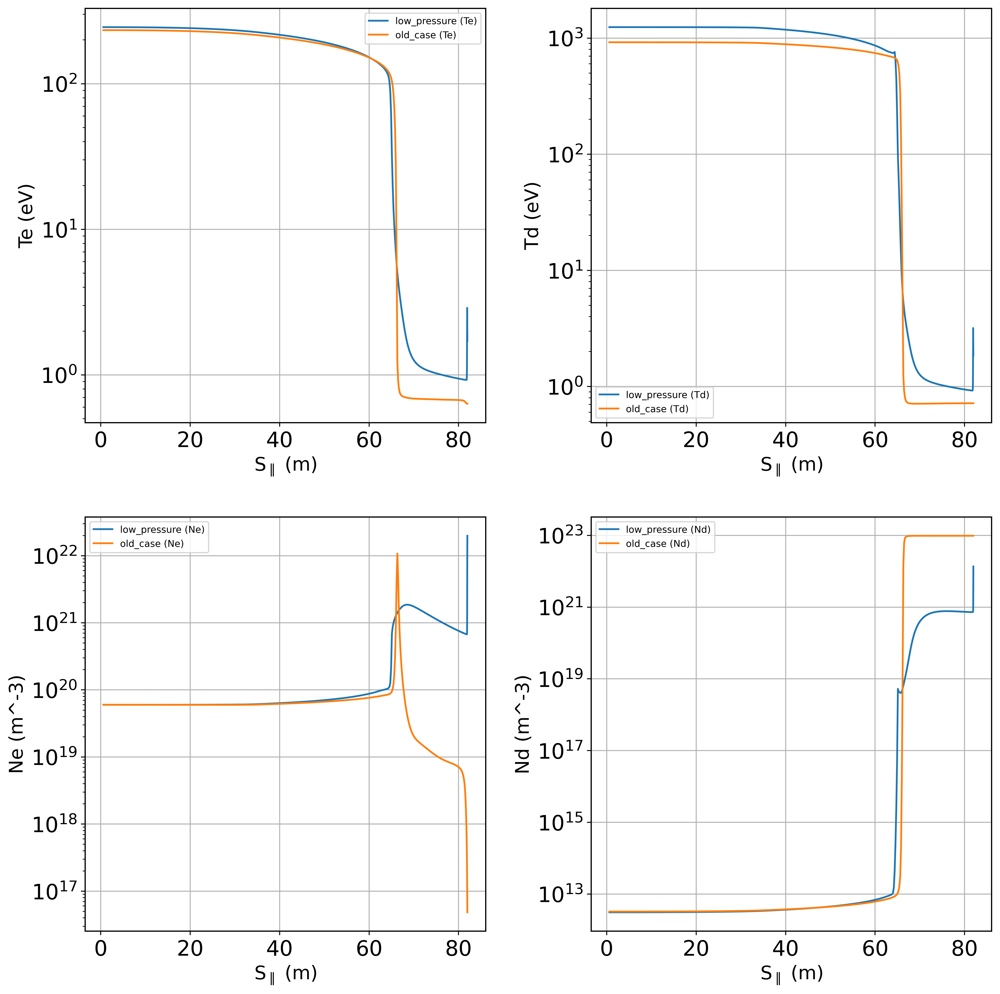

In [40]:
data_set = {'low_pressure': low_pressure, 'old_case': old_case}
ax = compare_profiles(data_set, variables = ['Te', 'Td', 'Ne', 'Nd'])
for ax in ax:
    ax.set_yscale('log')

In [4]:
y = low_pressure['y'].values[1:-1]
Nd = replace_guards(low_pressure['Nd'].isel(t=-1).values.squeeze())
Ne = replace_guards(low_pressure['Ne'].isel(t=-1).values.squeeze())
Te = replace_guards(low_pressure['Te'].isel(t=-1).values.squeeze())
Td = replace_guards(low_pressure['Td'].isel(t=-1).values.squeeze())

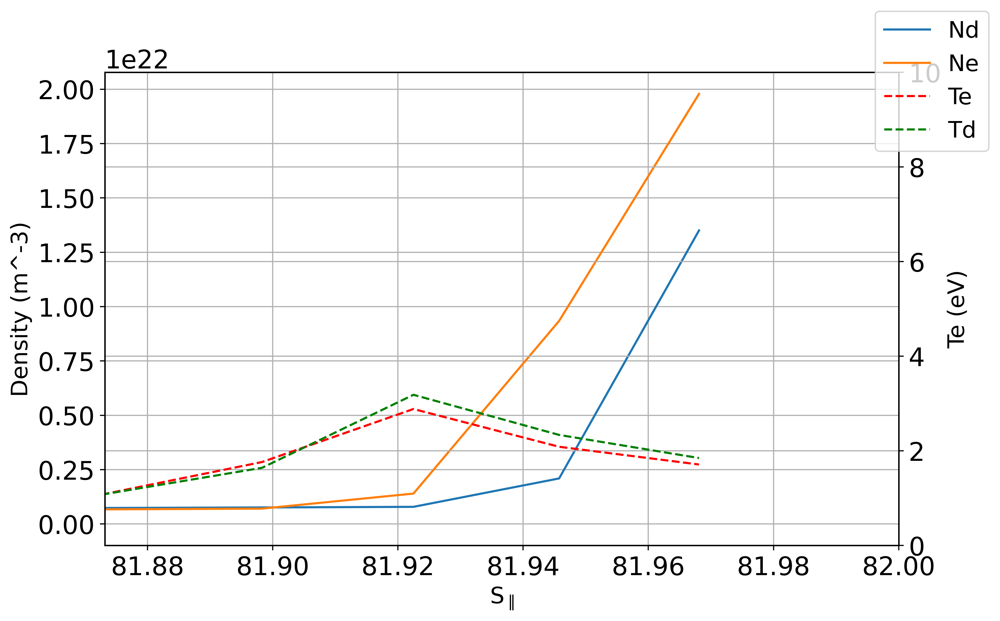

In [33]:
fig,ax = plt.subplots(1,1,figsize=(10,6), dpi = 500)

ax.plot(y, Nd, label = 'Nd')
ax.plot(y, Ne, label = 'Ne')



# ax.set_yscale('log')
ax.set_ylabel('Density (m^-3)')

ax2 = ax.twinx()
ax2.plot(y, Te, label = 'Te', linestyle = '--', color = 'red')
ax2.plot(y, Td, label = 'Td', linestyle = '--', color = 'green') 
ax2.set_ylabel('Te (eV)')
ax2.set_ybound(0,10)

ax.set_xlabel(r'S$_\parallel$')
ax.set_xbound(y[-5], 82)
fig.legend()

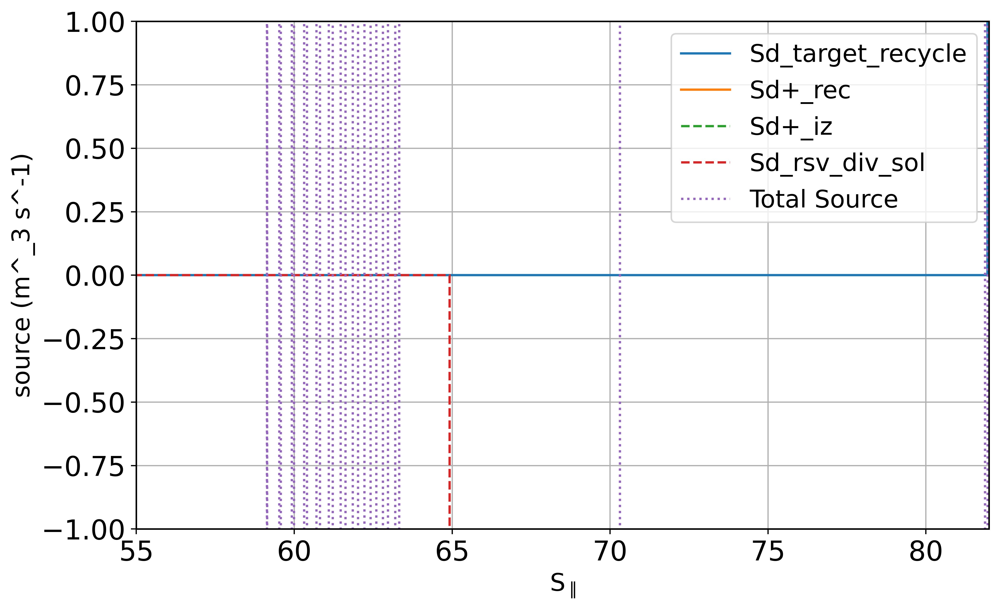

In [34]:
source_terms = ['Sd_target_recycle', 'Sd+_rec']
sink_terms = ['Sd+_iz','Sd_rsv_div_sol']
ax = spatial_sources(low_pressure, source_terms=source_terms, sink_terms=sink_terms, log_scale=True)

ax.set_xbound(55, 82)
# ax.set_ybound(-1, 1)
# ax.set_yscale('linear')

## Even slower pump

In [39]:
slower_pump = xh.open('/users/jlb647/scratch/simulation_program/hermes-3_sim/simulation_dir/2024-11_week_9/steady_state_density_source/reduce_density_1e20/case_02_7e20_even_slower_pump')

array([<Axes: xlabel='S$_\\parallel$ (m)', ylabel='Pe (Pa)'>,
       <Axes: xlabel='S$_\\parallel$ (m)', ylabel='Pd+ (Pa)'>,
       <Axes: xlabel='S$_\\parallel$ (m)', ylabel='Pd (Pa)'>, <Axes: >],
      dtype=object)

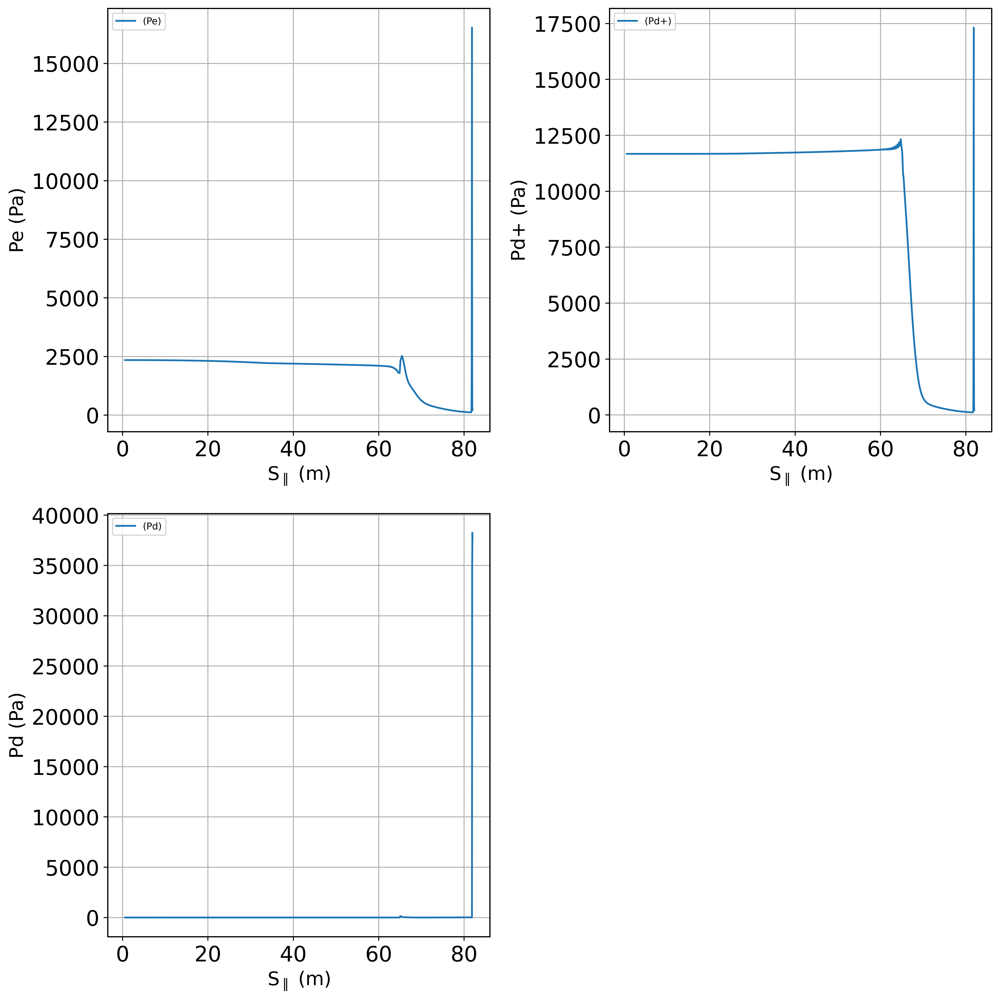

In [67]:
plot_profiles(slower_pump, variables = ['Pe', 'Pd+', 'Pd'])

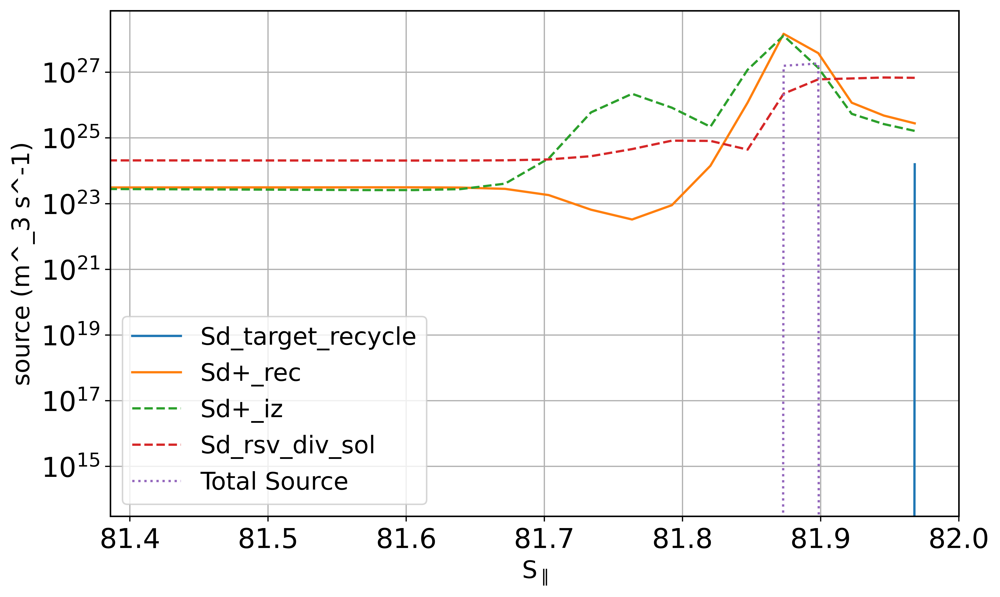

In [63]:
ax = spatial_sources(slower_pump, source_terms=source_terms, sink_terms=sink_terms, log_scale=True)

ax.set_xbound(y[-20], 82)

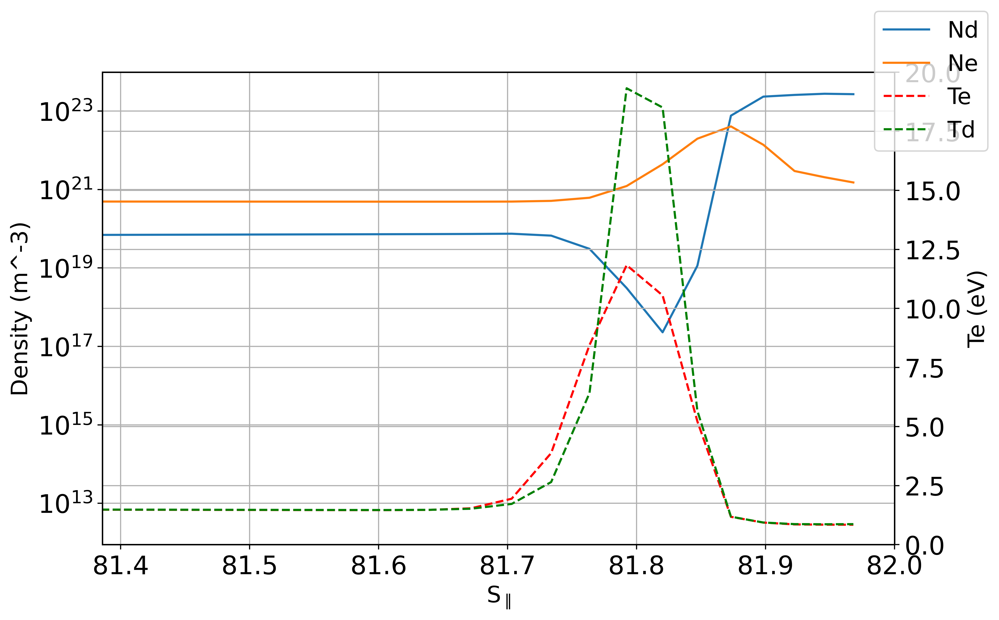

In [55]:
y = slower_pump['y'].values[1:-1]
Nd = replace_guards(slower_pump['Nd'].isel(t=-1).values.squeeze())
Ne = replace_guards(slower_pump['Ne'].isel(t=-1).values.squeeze())
Te = replace_guards(slower_pump['Te'].isel(t=-1).values.squeeze())
Td = replace_guards(slower_pump['Td'].isel(t=-1).values.squeeze())

fig,ax = plt.subplots(1,1,figsize=(10,6), dpi = 500)

ax.plot(y, Nd, label = 'Nd')
ax.plot(y, Ne, label = 'Ne')



ax.set_yscale('log')
ax.set_ylabel('Density (m^-3)')

ax2 = ax.twinx()
ax2.plot(y, Te, label = 'Te', linestyle = '--', color = 'red')
ax2.plot(y, Td, label = 'Td', linestyle = '--', color = 'green') 
ax2.set_ylabel('Te (eV)')
ax2.set_ybound(0,20)

ax.set_xlabel(r'S$_\parallel$')
ax.set_xbound(y[-20], 82)
fig.legend()

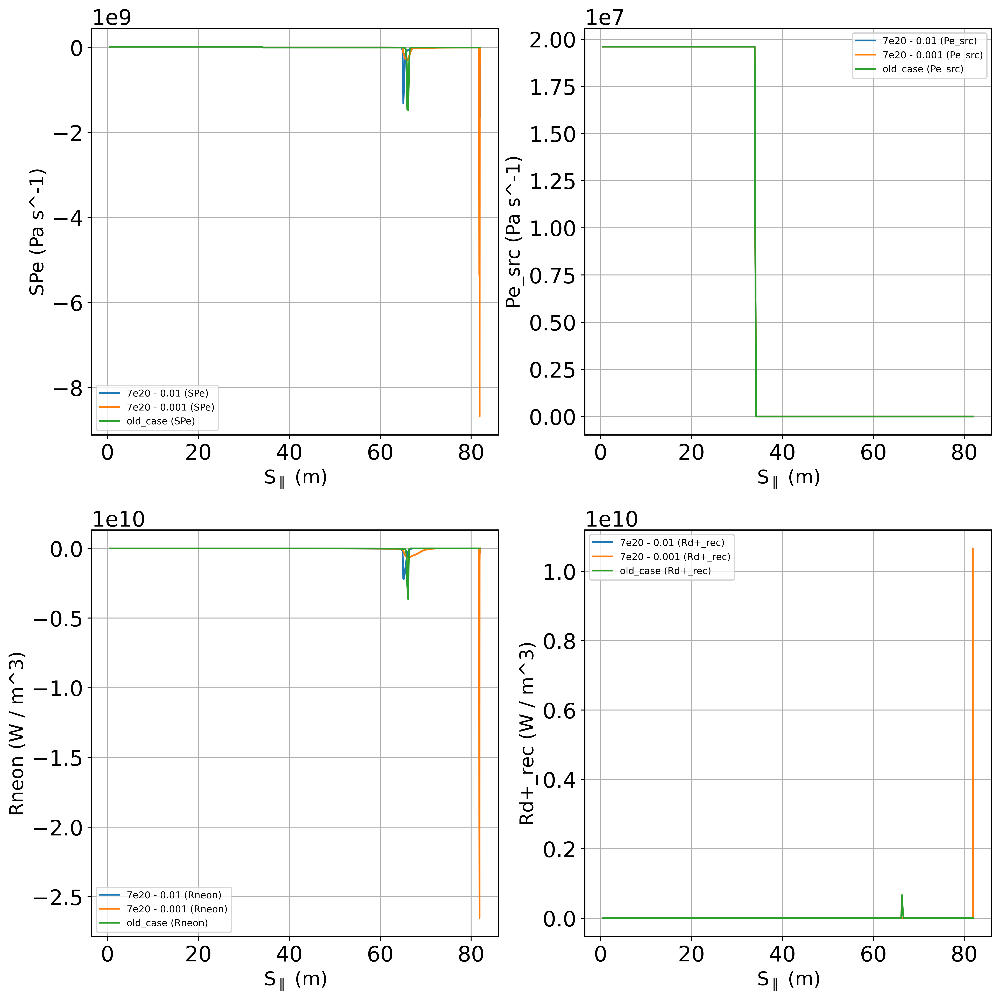

In [165]:
data_set = {'7e20 - 0.01': low_pressure, '7e20 - 0.001':slower_pump, 'old_case': old_case}
ax = compare_profiles(data_set, variables = ['SPe', 'Pe_src', 'Rneon', 'Rd+_rec'])



for ax in ax:
    # ax.set_yscale('log')
    ax.set_xbound(y[-50], 82)



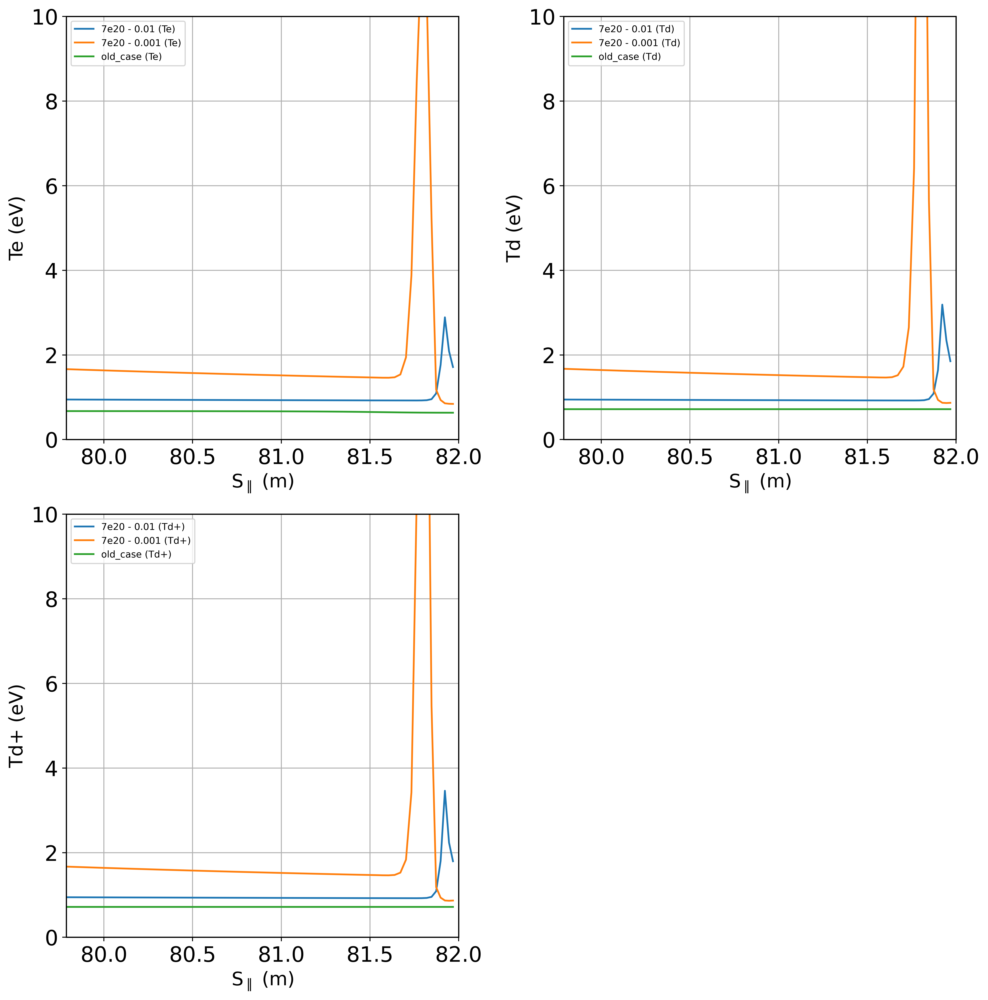

In [169]:
ax = compare_profiles(data_set, variables = ['Te', 'Td', 'Td+'])
for ax in ax:
    # ax.set_yscale('log')
    ax.set_ybound(0,10)
    ax.set_xbound(y[-50], 82)



In [ ]:
data_set = {'7e20 - 0.01': low_pressure, '7e20 - 0.001':slower_pump, 'old_case': old_case}
ax = compare_profiles(data_set, variables = [''])

for ax in ax:
    ax.set_yscale('log')
    ax.set_xbound(60, 83)

# ---- 

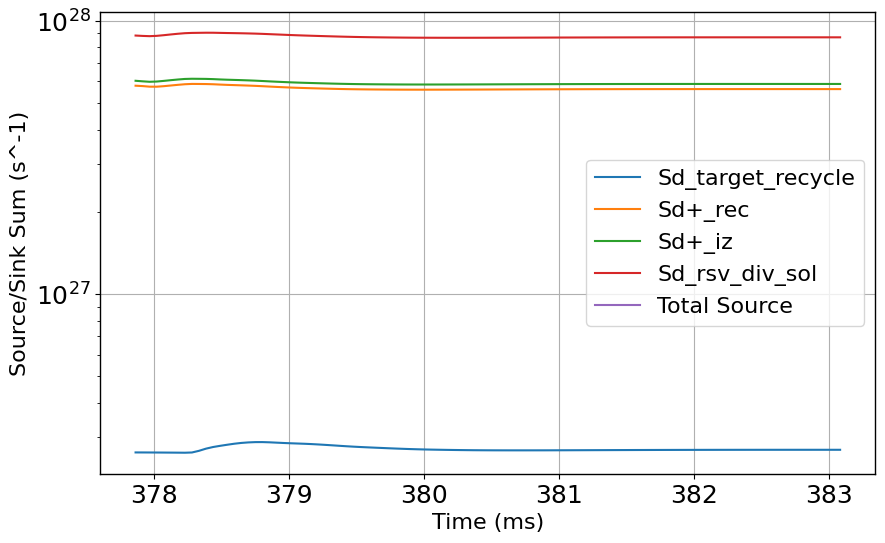

{'Sd_target_recycle': <xarray.DataArray (t: 101, x: 1)>
 dask.array<sum-aggregate, shape=(101, 1), dtype=float64, chunksize=(101, 1), chunktype=numpy.ndarray>
 Coordinates:
   * t        (t) float64 0.3779 0.3779 0.378 0.378 ... 0.3829 0.383 0.383 0.3831
   * x        (x) int64 0
     z        float64 3.142
 Attributes:
     current_time_index:  101
     cell_location:       CELL_CENTRE
     conversion:          9.578833303066081e+26
     direction_y:         Standard
     direction_z:         Standard
     long_name:           Target recycling particle source of d
     source:              recycling
     standard_name:       particle source
     time_dimension:      t
     units:               m^-3 s^-1
     metadata:            {'BOUT_VERSION': 5.2, 'Bnorm': 1.0, 'Cs0': 97871.514...
     options:             IncIntShear = false\t\t# type: bool, source: default...
     geometry:            
     units_type:          SI,
 'Sd+_rec': <xarray.DataArray (t: 101, x: 1)>
 dask.array<sum-agg

In [29]:
import numpy as np
import matplotlib.pyplot as plt

def sum_source(ds, sources=["Te"], sinks=[], plot=False, log_scale=False):
    """
    Sum specified sources and sinks across the spatial domain over time to check 
    for particle balance in steady state, and compute the net total source.

    Parameters:
        ds (xarray.Dataset): The dataset containing simulation data.
        sources (list of str): List of parameter names to sum as sources (positive).
        sinks (list of str): List of parameter names to sum as sinks (negative).
        plot (bool): Whether to plot the results. Default is False.
        log_scale (bool): Whether to use a logarithmic y-scale for the plot.
                          Default is False.
    
    Returns:
        dict: Contains the time-summed values for each source, sink, and the total net source.
    """
    
    # Convert time to milliseconds
    t = ds["t"].values * 1e3
    
    # Compute the volume element (assuming dx, dy, dz, and J are consistent across y)
    volume_element = ds["dx"] * ds["dy"] * ds["dz"] * ds["J"]
    
    # Dictionary to store results for each parameter and the total
    results = {}
    total_source = 0  # Initialize total source to accumulate contributions
    
    # Process sources (positive terms)
    for source_param in sources:
        if source_param not in ds:
            raise ValueError(f"Source parameter '{source_param}' not found in the dataset.")
        
        # Squeeze out singleton dimensions and compute volume-weighted sum
        source = np.abs(ds[source_param].squeeze())
        
        time_sum = (source * volume_element).sum(dim="y")
        
        # Accumulate into total source as positive
        total_source += time_sum
        
        # Store individual source results
        results[source_param] = time_sum
    
    # Process sinks (negative terms)
    for sink_param in sinks:
        if sink_param not in ds:
            raise ValueError(f"Sink parameter '{sink_param}' not found in the dataset.")
        
        # Squeeze out singleton dimensions and compute volume-weighted sum
        sink = np.abs(ds[sink_param].squeeze())
        time_sum = (sink * volume_element).sum(dim="y")
        
        # Accumulate into total source as negative
        total_source -= time_sum  # Subtracting the sink terms
        
        # Store individual sink results as positive if log_scale is True
        results[sink_param] = time_sum if log_scale else -time_sum
    
    # Store the total source/sink in the results
    results['Total Source'] = total_source
    
    # Plot if requested
    if plot:
        plt.figure(figsize=(10, 6))
        
        for parameter, time_sum in results.items():
            plt.plot(t, time_sum.values, label=parameter)
        
        plt.xlabel("Time (ms)")
        plt.ylabel("Source/Sink Sum (s^-1)")
        if log_scale:
            plt.yscale("log")
        plt.legend()
        plt.show()
    
    return results

# Positive is neutral source, negative is sink (i.e ion source and pump)
source_terms = ['Sd_target_recycle', 'Sd+_rec']
sink_terms = ['Sd+_iz','Sd_rsv_div_sol']


sum_source(ds, sources=source_terms, sinks = sink_terms, plot=True, log_scale=True)

# Rise time fitting

In [3]:
rise250 = xh.open('/users/jlb647/scratch/simulation_program/hermes-3_sim/simulation_dir/2024-11_week_9/rise_time_work/case_03_reduce_rise_time_125')
rise125 = xh.open('/users/jlb647/scratch/simulation_program/hermes-3_sim/simulation_dir/2024-11_week_9/rise_time_work/case_04_reduce_rise_time_250')

In [94]:
def spitzer_electron_simple(dataframe):
    """
    Calculate Spitzer-Harm with hermes-3 conductivity output.
    """
    x = dataframe['y']
    Te = dataframe['Te']
    kappa_e = dataframe['kappa_par_e']
    grad_T = np.gradient(Te, x)
    q = -kappa_e * grad_T

    return q

def replace_guards(var):
    """
    This in-place replaces the points in the guard cells with the points 
    on the boundary.
    """
    var = var[1:-1]  # Strip the edge guard cells

    var[0] = 0.5 * (var[0] + var[1])
    var[-1] = 0.5 * (var[-1] + var[-2])
    
    return var




In [6]:
import numpy as np

def replace_guards(var):
    """
    Replace the points in the guard cells with boundary values.
    """
    if len(var) <= 2:
        return var  # Return as-is if there are insufficient points to replace

    var = var[1:-1]  # Strip the edge guard cells

    var[0] = 0.5 * (var[0] + var[1])
    var[-1] = 0.5 * (var[-1] + var[-2])
    
    return var

def heatflux_t_profile(ds, location='target'):
    t = ds['t'].values * 1e3  # Convert time to milliseconds
    xpoint_location = ds.options['mesh']['length_xpt']
    y = ds['y'].values

    target_flux = []
    xpoint_flux = []

    # Find x-point index based on location
    x_point_index = np.argmin(np.abs(y - xpoint_location))

    # Ensure that kappa_e and Te are reshaped to 2D [time, y]
    kappa_e = ds['kappa_par_e'].values.reshape(len(t), len(y))
    Te = ds['Te'].values.reshape(len(t), len(y))

    # Apply replace_guards to each time slice
    kappa_e = np.apply_along_axis(replace_guards, axis=1, arr=kappa_e)
    Te = np.apply_along_axis(replace_guards, axis=1, arr=Te)

    # Calculate the gradient of Te along the y-axis
    grad_T = np.gradient(Te, axis=1)
    q = -kappa_e * grad_T

    if location == 'target':
        # Collect heat flux at the target (last index along y-axis)
        for indx in range(len(t)):
            target_flux.append(np.sum(q[indx, -1]))

        return target_flux

    elif location == 'xpoint':
        # Collect heat flux at the x-point location
        for indx in range(len(t)):
            xpoint_flux.append(np.sum(q[indx, x_point_index]))

        return xpoint_flux

    elif location == 'upstream':
        # Collect upstream source flux directly without modification
        src = ds['SPe'].values.reshape(len(t), len(y))
        src_upstream = src[:, 0]
        # print(src_upstream)

        return src_upstream

    else:
        raise ValueError("Invalid location specified. Choose 'target', 'xpoint', or 'upstream'.")

# Example usage (requires `rise` dataset as input):
# target_flux = heatflux_t_profile(rise, location='target')






In [8]:
t_250  = rise250['t'].values * 1e3
heatflux_250 = heatflux_t_profile(rise250, location='target')
upstream_250 = heatflux_t_profile(rise250, location='upstream')

t_125 = rise125['t'].values * 1e3
heatflux_125 = heatflux_t_profile(rise125, location='target')
upstream_250 = heatflux_t_profile(rise125, location='upstream')


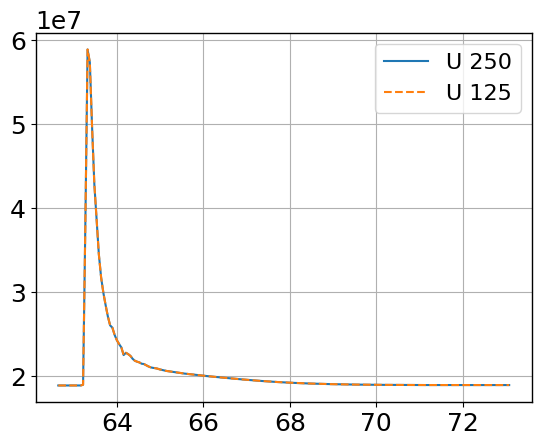

In [13]:
# plt.plot(t_250, heatflux_250, label = 'T 250')
plt.plot(t_250, upstream_250, label = 'U 250')
# plt.plot(t_125, heatflux_125, label = 'T 125')
plt.plot(t_125, upstream_250, label = 'U 125', linestyle = '--')
plt.legend()

[12056809.32357547 12056899.30167895 12057032.17278567 ...
 12061821.35293106 12061837.53419726 12061857.9902574 ]
6891150.300484876


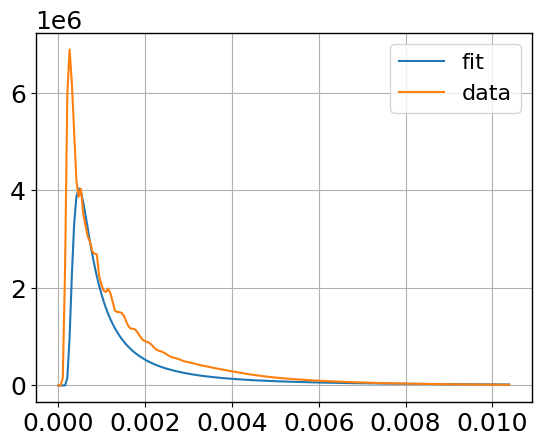

In [193]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

heatflux = heatflux_t_profile(rise)
upstream_source = heatflux_t_profile(rise, location='upstream')


sim_start_timestep      = 63.05569591723306e-3          # Un-normalized time of the last time step
rise_start              = 0.5e-3

pulse_start = sim_start_timestep + rise_start  # Time of the rise midpoint  

pulse_start_index = np.abs(rise['t'].values - pulse_start).argmin()

t = rise['t'].values[pulse_start_index: pulse_start_index + 200]

heatflux = heatflux[pulse_start_index: pulse_start_index + 200]
heatflux = heatflux - np.min(heatflux)

upstream_source = upstream_source[pulse_start_index: pulse_start_index + 200]
upstream_source = upstream_source - np.min(upstream_source)
t = t - t[0]
t[0] = 1e-9

max_flux = np.max(heatflux)
max_upstream = np.max(upstream_source)
print(max_flux)

# Fittin function
def q_div_elm(t, tau, decay, q_max_div_elm):
    return  q_max_div_elm * ((1 + (tau / t)**2) * (tau / t)**2 * np.exp(-decay*((tau / t))**2))




tau = 500e-6* 0.8
decay = 2
qmax = 2 * max_flux

# plt.plot(t, upstream_source, label = 'upstream source')
q_func = q_div_elm(t, tau, decay, qmax)
plt.plot(t, q_func, label = 'fit')

# # plt.plot(t, q_func, label = 'fit')
plt.plot(t, heatflux, label = 'data')
plt.legend()
# plt.yscale('log')





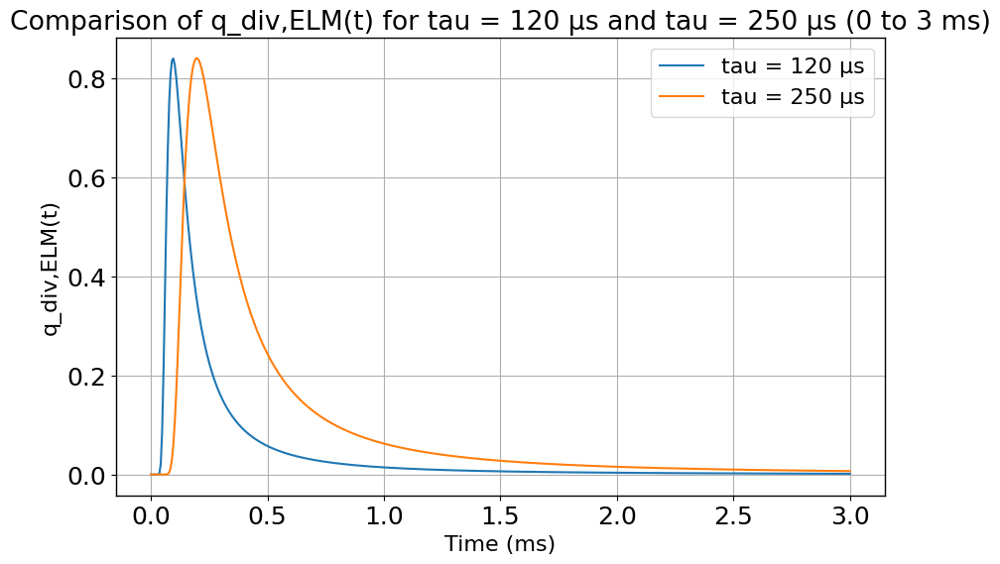

In [185]:
import numpy as np
import matplotlib.pyplot as plt

# Parameters
q_max = 1  # Given q_max
tau1 = 120e-6  # tau = 120 microseconds
tau2 = 250e-6  # tau = 250 microseconds

# Time range from near zero to 3 milliseconds
t_values_extended = np.linspace(1e-9, 3e-3, 500)  # from near zero to 3 ms

# Compute q_div_ELM for each tau over the extended time range
q_div_ELM_tau1 = (
    q_max * (1 + (tau1 / t_values_extended) ** 2) * (tau1 / t_values_extended) ** 2 *
    np.exp(-(tau1 / t_values_extended) ** 2)
)
q_div_ELM_tau2 = (
    q_max * (1 + (tau2 / t_values_extended) ** 2) * (tau2 / t_values_extended) ** 2 *
    np.exp(-(tau2 / t_values_extended) ** 2)
)

# Plotting both on the same figure
plt.figure(figsize=(10, 6))
plt.plot(t_values_extended * 1e3, q_div_ELM_tau1, label="tau = 120 μs")
plt.plot(t_values_extended * 1e3, q_div_ELM_tau2, label="tau = 250 μs")
plt.xlabel("Time (ms)")
plt.ylabel("q_div,ELM(t)")
plt.title("Comparison of q_div,ELM(t) for tau = 120 μs and tau = 250 μs (0 to 3 ms)")
plt.legend()
plt.grid(True)
plt.show()


[2.0000000e-04 1.0000000e+00 6.8911503e+06]


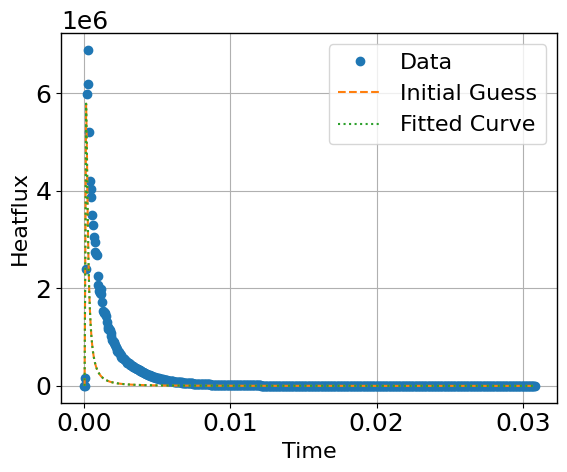

In [124]:
# Initial guesses for parameters
initial_guess = [250e-6 * 0.8, 1, max_flux]  # Adjust these as necessary based on your data

# Fit the function to the data
params, covariance = curve_fit(q_div_elm, t, heatflux, p0=initial_guess)

# Extract fitted parameters
tau_fit, decay_fit, flux = params


# Generate fitted values using the fitted parameters
fitted_heatflux = q_div_elm(t, tau_fit, decay_fit, flux)

print(params)

# Plot the original data
plt.plot(t, heatflux, 'o', label='Data')
initial_guess = q_div_elm(t, *initial_guess)
plt.plot(t, initial_guess, '--', label='Initial Guess')

# Plot the fitted curve
plt.plot(t, fitted_heatflux, ':', label='Fitted Curve')
plt.xlabel("Time")
plt.ylabel("Heatflux")
plt.legend()
plt.show()


## Time profile


In [ ]:
epsilon_min             = 1e-9          # Small number to avoid divide by zero in t_current
sim_start_timestep      = 63.05569591723306e-3          # Un-normalized time of the last time step
rise_start              = 0.5e-3          # Offset from the sim start time step
t_rise                  = sim_start_timestep + rise_start  # Time of the rise midpoint

# Calculate t_current using BOUT++'s max function
t_current               = max(t - t_rise, epsilon_min)  # Time since ELM pulse started

# Constants for the rise
t_ramp                  = 250e-6  # Rise time of the ELM
base_heat_flux          = 1.0     # Baseline heat flux
power_increase          = 4.0     # Power increase factor

# Calculate base_multiplier using BOUT++ compatible functions
base_multiplier = (base_heat_flux + power(t_ramp / t_current, 2)) * power(t_ramp / t_current, 2) * exp(-power(t_ramp / t_current, 2))

# Use hardcoded max_base_multiplier for now
max_base_multiplier     = 0.84  # Ensure this value is appropriate for your case

# Normalize the multiplier
normalised_multiplier   = base_multiplier / max_base_multiplier

# Calculate source_prefactor
source_prefactor = 1 + (power_increase - 1) * normalised_multiplier

Maximum base multiplier: 0.839909218750507


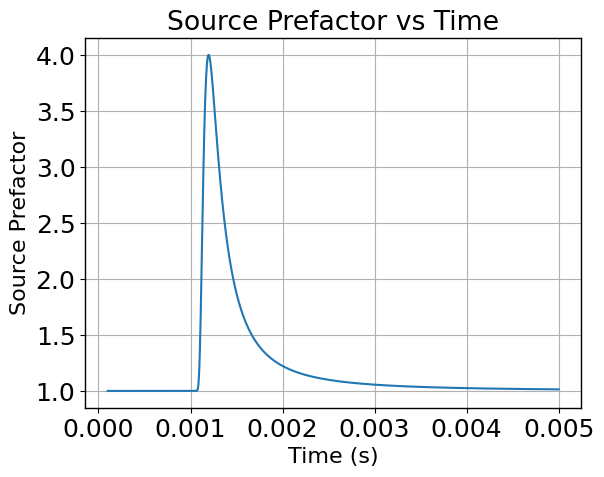

In [116]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.optimize as opt

# Time points for the plot
t = np.linspace(1e-4, 5e-3, 1000)  # Extended Time points

omega_ci = 95788333.0    # normalise to simulation timestep
epsilon_min = 1e-9       # small number to avoid divide by zero in t_current
sim_start_timestep = 1e-3
rise_start = 1e-3        # offset from the sim start time step
t_rise = (sim_start_timestep / omega_ci) + rise_start
t_current = np.maximum(t - t_rise, epsilon_min)  # time since ELM pulse started

t_ramp = 250e-6  # Rise time of the ELM
base_heat_flux = 1.0  # Baseline heat flux
power_increase = 4.0  # Power increase factor

# Function to calculate base_multiplier for a given t
def base_multiplier_func(t, t_rise, t_ramp, base_heat_flux):
    t_current = np.maximum(t - t_rise, epsilon_min)
    base_multiplier = (base_heat_flux + (t_ramp / t_current)**2) * \
                      (t_ramp / t_current)**2 * np.exp(-(t_ramp / t_current)**2)
    return base_multiplier

# Use optimization to find the maximum of base_multiplier
result = opt.minimize_scalar(lambda t: -base_multiplier_func(t, t_rise, t_ramp, base_heat_flux), 
                             bounds=(1e-4, 5e-3), method='bounded')

max_base_multiplier = -result.fun  # Get the maximum value
print(f"Maximum base multiplier: {max_base_multiplier}")

# Calculate base_multiplier over the time range
base_multiplier = (base_heat_flux + (t_ramp / t_current)**2) * \
                  (t_ramp / t_current)**2 * np.exp(-(t_ramp / t_current)**2)


# Normalize with the calculated maximum
normalised_multiplier = base_multiplier / max_base_multiplier

source_prefactor = 1 + (power_increase - 1) * normalised_multiplier

# Plotting the source_prefactor as a function of time
plt.plot(t, source_prefactor)
plt.xlabel("Time (s)")
plt.ylabel("Source Prefactor")
plt.title("Source Prefactor vs Time")
plt.grid(True)
plt.show()


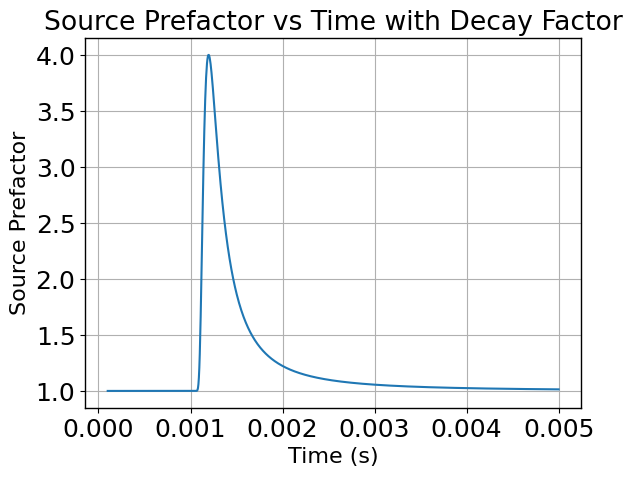

In [122]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.optimize as opt

def calculate_source_prefactor(
    t,
    omega_ci=95788333.0,
    epsilon_min=1e-9,
    sim_start_timestep=1e-3,
    rise_start=1e-3,
    t_ramp=250e-6,
    base_heat_flux=1.0,
    power_increase=4.0,
    decay_factor=1.0
):
    """
    Calculate the source prefactor with a decay factor for an ELM pulse.

    Parameters:
        t (np.ndarray): Array of time points (in seconds).
        omega_ci (float): Normalisation factor for time steps.
        epsilon_min (float): Small constant to avoid division by zero.
        sim_start_timestep (float): Start time of the simulation.
        rise_start (float): Offset from the simulation start time.
        t_ramp (float): Rise time of the ELM.
        base_heat_flux (float): Baseline heat flux.
        power_increase (float): Factor by which the power increases.
        decay_factor (float): Factor that scales the decay rate.

    Returns:
        np.ndarray: The calculated source prefactor over the time range.
    """
    
    # Calculate the rise time midpoint
    t_rise = (sim_start_timestep / omega_ci) + rise_start

    # Time since the ELM pulse started
    t_current = np.maximum(t - t_rise, epsilon_min)
    
    # Define the base multiplier function, incorporating the decay factor
    def base_multiplier_func(t_val, t_rise, t_ramp, base_heat_flux, decay_factor):
        t_current_val = np.maximum(t_val - t_rise, epsilon_min)
        base_multiplier = (base_heat_flux + (t_ramp / t_current_val)**2) * \
                          (t_ramp / t_current_val)**2 * np.exp(-decay_factor * (t_ramp / t_current_val)**2)
        return base_multiplier

    # Find the maximum of base_multiplier over the time range
    result = opt.minimize_scalar(
        lambda t_val: -base_multiplier_func(t_val, t_rise, t_ramp, base_heat_flux, decay_factor), 
        bounds=(1e-4, 5e-3), method='bounded'
    )
    max_base_multiplier = -result.fun  # Get the maximum value

    # Calculate the base multiplier over the time range with the specified decay factor
    base_multiplier = (base_heat_flux + (t_ramp / t_current)**2) * \
                      (t_ramp / t_current)**2 * np.exp(-decay_factor * (t_ramp / t_current)**2)

    # Normalize the base multiplier with the calculated maximum
    normalised_multiplier = base_multiplier / max_base_multiplier

    # Calculate the source prefactor
    source_prefactor = 1 + (power_increase - 1) * normalised_multiplier

    return source_prefactor

# Example usage
t = np.linspace(1e-4, 5e-3, 1000)  # Time range in seconds
source_prefactor = calculate_source_prefactor(t, decay_factor=1)

# Plotting the source_prefactor as a function of time
plt.plot(t, source_prefactor)
plt.xlabel("Time (s)")
plt.ylabel("Source Prefactor")
plt.title("Source Prefactor vs Time with Decay Factor")
plt.grid(True)
plt.show()


[12056809.32357547 12056899.30167895 12057032.17278567 ...
 12061821.35293106 12061837.53419726 12061857.9902574 ]


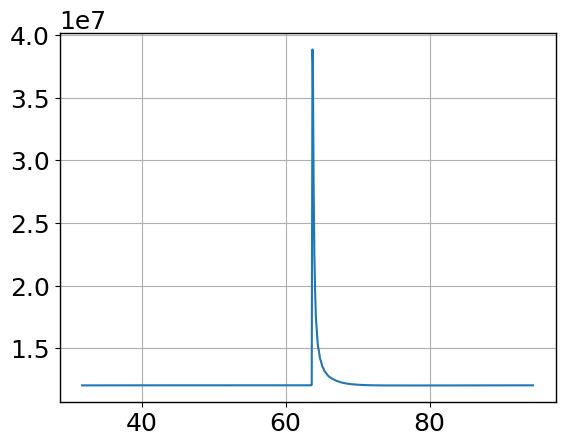

In [145]:
import numpy as np

def replace_guards(var):
    """
    Replace the points in the guard cells with boundary values.
    """
    if len(var) <= 2:
        return var  # Return as-is if there are insufficient points to replace

    var = var[1:-1]  # Strip the edge guard cells

    var[0] = 0.5 * (var[0] + var[1])
    var[-1] = 0.5 * (var[-1] + var[-2])
    
    return var

def heatflux_t_profile(ds, location='target'):
    t = ds['t'].values * 1e3  # Convert time to milliseconds
    xpoint_location = ds.options['mesh']['length_xpt']
    y = ds['y'].values

    target_flux = []
    xpoint_flux = []

    # Find x-point index based on location
    x_point_index = np.argmin(np.abs(y - xpoint_location))

    # Ensure that kappa_e and Te are reshaped to 2D [time, y]
    kappa_e = ds['kappa_par_e'].values.reshape(len(t), len(y))
    Te = ds['Te'].values.reshape(len(t), len(y))

    # Apply replace_guards to each time slice
    kappa_e = np.apply_along_axis(replace_guards, axis=1, arr=kappa_e)
    Te = np.apply_along_axis(replace_guards, axis=1, arr=Te)

    # Calculate the gradient of Te along the y-axis
    grad_T = np.gradient(Te, axis=1)
    q = -kappa_e * grad_T

    if location == 'target':
        # Collect heat flux at the target (last index along y-axis)
        for indx in range(len(t)):
            target_flux.append(np.sum(q[indx, -1]))

        return target_flux

    elif location == 'xpoint':
        # Collect heat flux at the x-point location
        for indx in range(len(t)):
            xpoint_flux.append(np.sum(q[indx, x_point_index]))

        return xpoint_flux

    elif location == 'upstream':
        # Collect upstream source flux directly without modification
        src = ds['SPe'].values.reshape(len(t), len(y))
        src_upstream = src[:, 0]
        print(src_upstream)

        return src_upstream

    else:
        raise ValueError("Invalid location specified. Choose 'target', 'xpoint', or 'upstream'.")

# Example usage (requires `rise` dataset as input):
# target_flux = heatflux_t_profile(rise, location='target')


heatflux_t_profile(rise)

sim_start_timestep      = 63.05569591723306e-3          # Un-normalized time of the last time step
rise_start              = 0.5e-3

pulse_start = sim_start_timestep + rise_start  # Time of the rise midpoint  


plt.plot(t, heatflux_t_profile(rise, location='upstream'))
# print(rise.options['mesh']['length_xpt'])

398


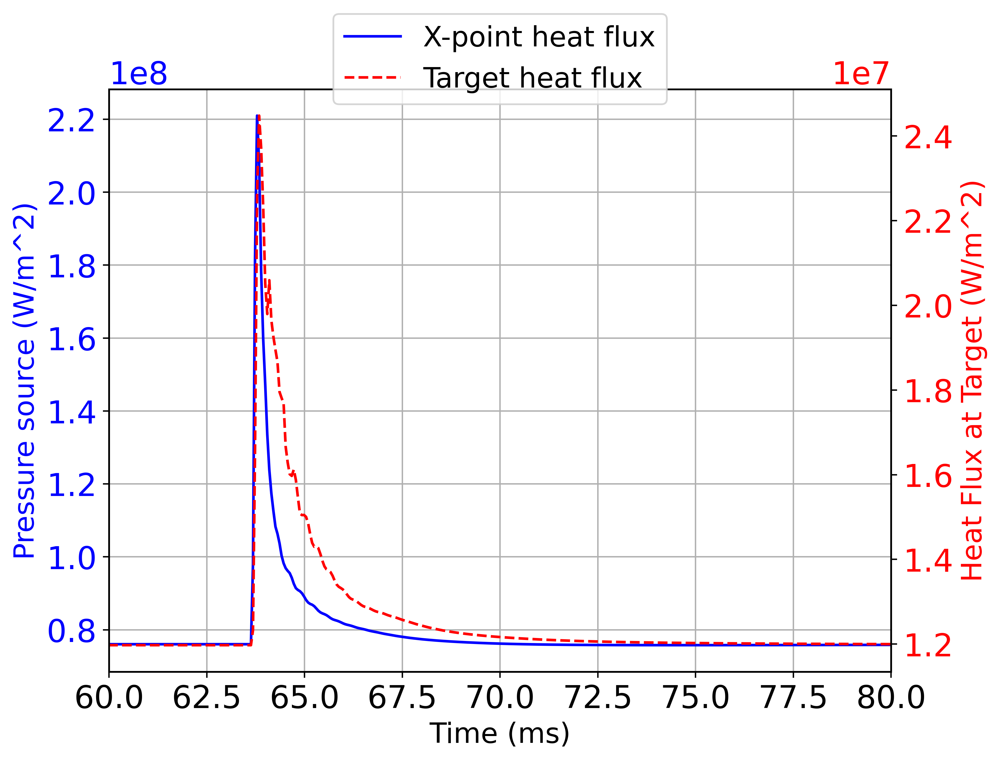

In [127]:
y = rise['y'].values[1:-1]

t = rise['t'].values * 1e3
src = rise['Pe_src'].values.reshape(1201,400)

kappa = rise['kappa_par_e'].values.reshape(1201,400)
Te = rise['Te'].values.reshape(1201,400)

grad_Te = np.gradient(Te, axis=1)

# t = rise['t'].values * 1e3
# src = rise['Pe_src'].values.reshape(1201,400)


src_upstream = src[:,0]

q = -kappa * grad_Te

q = np.apply_along_axis(replace_guards, 1, q)

print(len(q[1]))

target_flux = []
upstream_flux = []
xpoint_flux = []
x_point_index = np.argmin(np.abs(y - 34))


for indx,i in enumerate(t):
    target_flux.append(q[indx][-1])
    upstream_flux.append(q[indx][0])
    xpoint_flux.append(q[indx][x_point_index])
    # print(i)
# print(target_flux)
# plt.plot(y, q[-1], label='Heat Flux at last time slice')

fig,ax = plt.subplots(1,1,figsize=(8,6),dpi=500)

ax2 = ax.twinx()


# ax2.plot(t, upstream_flux, label='Upstream Heat flux', color='orange')
ax.plot(t, xpoint_flux, label='X-point heat flux', color='blue')
# ax.plot(t, src_upstream, label='Upstream Heat Source', color='blue')
ax2.plot(t, target_flux, label='Target heat flux', color='red', linestyle='--')
ax2.grid(False)
fig.legend(loc = 'upper center')
ax.set_xlabel('Time (ms)')
ax.set_ylabel('Pressure source (W/m^2)', color = 'blue')
ax2.set_ylabel('Heat Flux at Target (W/m^2)', color='red')
# ax.set_yscale('log')
# ax2.set_yscale('log')
ax.set_xlim(60, 80)
ax2.tick_params(axis='y', labelcolor='red')
ax.tick_params(axis='y', labelcolor='blue')


Rise time for src_upstream (10% to 100%): None ms
Rise time for target_flux (10% to 100%): None ms


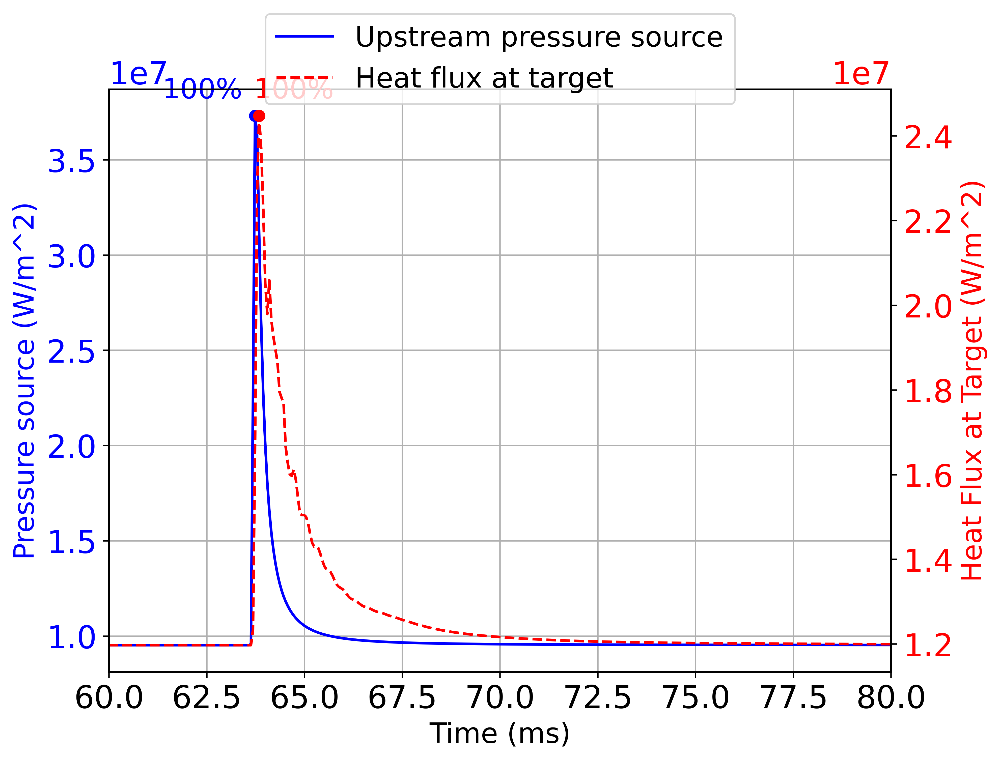

In [151]:
import numpy as np
import matplotlib.pyplot as plt

# Assuming t, src_upstream, target_flux are already defined as in your code

# Find peaks
peak_src_upstream = np.max(src_upstream)
peak_target_flux = np.max(target_flux)

# Function to find the time at a specified fraction of the peak value (for rising and falling parts)
def find_time_to_fraction(signal, time_array, peak_value, fraction, rise=True):
    target_value = peak_value * fraction
    if rise:
        # Find the first crossing above the target value
        for i in range(1, len(signal)):
            if signal[i-1] < target_value and signal[i] >= target_value:
                # Linear interpolation to estimate the exact crossing time
                slope = (signal[i] - signal[i-1]) / (time_array[i] - time_array[i-1])
                intercept = signal[i-1] - slope * time_array[i-1]
                crossing_time = (target_value - intercept) / slope
                return crossing_time
    else:
        # Find the first crossing below the target value after the peak
        peak_index = np.argmax(signal)
        for i in range(peak_index, len(signal) - 1):
            if signal[i] >= target_value and signal[i + 1] < target_value:
                slope = (signal[i + 1] - signal[i]) / (time_array[i + 1] - time_array[i])
                intercept = signal[i] - slope * time_array[i]
                crossing_time = (target_value - intercept) / slope
                return crossing_time
    return None  # If no crossing is found

# Calculate rise times from 10% to 100% of the peak for each curve
fractions = [0.1, 1.0]  # 10% and 100%
rise_times_src_upstream = {f"{int(fraction * 100)}%": find_time_to_fraction(src_upstream, t, peak_src_upstream, fraction, rise=True) for fraction in fractions}
rise_times_target_flux = {f"{int(fraction * 100)}%": find_time_to_fraction(target_flux, t, peak_target_flux, fraction, rise=True) for fraction in fractions}

# Calculate the rise time as the difference between the times at 10% and 100%
rise_time_src_upstream = (rise_times_src_upstream["100%"] - rise_times_src_upstream["10%"]) if rise_times_src_upstream["10%"] and rise_times_src_upstream["100%"] else None
rise_time_target_flux = (rise_times_target_flux["100%"] - rise_times_target_flux["10%"]) if rise_times_target_flux["10%"] and rise_times_target_flux["100%"] else None

# Print rise times
print(f"Rise time for src_upstream (10% to 100%): {rise_time_src_upstream} ms")
print(f"Rise time for target_flux (10% to 100%): {rise_time_target_flux} ms")

# Plot the original data with markers for 10% and 100% rise points
fig, ax = plt.subplots(1, 1, figsize=(8, 6), dpi=500)
ax2 = ax.twinx()

ax.plot(t, src_upstream, label="Upstream pressure source", color="blue")
ax2.plot(t, target_flux, label="Heat flux at target", color="red", linestyle="--")
ax2.grid(False)

# Define markers for different thresholds
markers = {"10%": "s", "100%": "o"}  # Square for 10%, Circle for 100%

# Add vertical lines and markers for 10% and 100% rise points
for fraction, time in rise_times_src_upstream.items():
    if time:
        value = peak_src_upstream * float(fraction[:-1]) / 100
        ax.plot(time, value, marker=markers[fraction], color="blue")
        ax.annotate(f"{fraction}", (time, value), textcoords="offset points", xytext=(-30, 10), ha='center', color="blue")

for fraction, time in rise_times_target_flux.items():
    if time:
        value = peak_target_flux * float(fraction[:-1]) / 100
        ax2.plot(time, value, marker=markers[fraction], color="red")
        ax2.annotate(f"{fraction}", (time, value), textcoords="offset points", xytext=(20, 10), ha='center', color="red")

# Set labels and legend
fig.legend(loc="upper center")
ax.set_xlabel("Time (ms)")
ax.set_ylabel("Pressure source (W/m^2)", color="blue")
ax2.set_ylabel("Heat Flux at Target (W/m^2)", color="red")
ax.set_xlim(60, 80)
ax2.tick_params(axis="y", labelcolor="red")
ax.tick_params(axis="y", labelcolor="blue")

plt.show()
